In [57]:
import pyfits
from scipy.ndimage import gaussian_filter
import scipy.optimize as opt
import numpy as np
import pylab as plt
import rydlab
import pandas as pd
import os
import copy
from lmfit import Model
from lmfit.models import LorentzianModel
from lmfit.models import ExponentialModel
from lmfit.models import ConstantModel
from lmfit import Parameters, minimize, report_fit, Model
from matplotlib.colors import LinearSegmentedColormap, to_rgb
import seaborn as sns
sns.set_style("dark")
#sns.set_style("darkgrid")
import matplotlib as mpl
import uncertainties as unc  
import uncertainties.unumpy as unumpy  
from uncertainties import ufloat
from mpl_toolkits.mplot3d import Axes3D
fig3D = plt.figure()
ax3D = fig.add_subplot(111, projection='3d')

pd.options.display.max_colwidth = 120
mpl.rc('image', cmap='afmhot')
path= '/home/qd/Schreibtisch/Data/'
file_date = '2019-07-19'
folders = rydlab.analyze_folder(path,filter=False) 
slicer = (slice(15,95),slice(40,320))
binning_scale = 1
folders

,Name,Valid
0,/home/qd/Schreibtisch/Data/.ipynb_checkpoints,False
1,/home/qd/Schreibtisch/Data/2019_IEI,False
2,/home/qd/Schreibtisch/Data/2019_IEI_new,False
3,/home/qd/Schreibtisch/Data/DENSITYSCAN,True
4,/home/qd/Schreibtisch/Data/DENSITYSCAN_averaged_images,False
5,/home/qd/Schreibtisch/Data/Density_vs_EIT_averaged_images,False
6,/home/qd/Schreibtisch/Data/Linescan_lowOMEGA_lowDENSITY_2_averaged_images,False
7,/home/qd/Schreibtisch/Data/New Analysis,False
8,/home/qd/Schreibtisch/Data/Older Analysis,False
9,/home/qd/Schreibtisch/Data/Older Data,False


<Figure size 432x288 with 0 Axes>

In [51]:
path=folders.Name[4]

os.chdir(path)

variables = np.loadtxt(file_date+'_variables.dat' )[:,1]

N = len(variables)

print(os.getcwd())

def params_to_dict(params):
    return {key: params[key].value for key in params.keys()}


class Fit2d:
    colors = [(1, 1, 1), to_rgb("#5597C6"), to_rgb("#60BD68"), to_rgb("#FAA43A"), to_rgb("#d37096")]

    c_map_name = 'my_list'
    cm = LinearSegmentedColormap.from_list(c_map_name, colors, N=200)

    @staticmethod
    def _function(x, y):
        pass
    
    def __init__(self, data, x=None, y=None, params=None):
        self.data = data
        if x is None or y is None:
            self.x, self.y = self.get_mesh()

        if params is None:
            model = Model(self._function)
            params = model.make_params()

        self.params = params
        self.fit_object = None

    def fit_data(self, method='LeastSq'):
        fit_object = minimize(self.residuals, self.params, method=method)
        self.fit_object = fit_object
        self.params = fit_object.params

    def residuals(self, p):
        return self.data - self._function([self.x, self.y], **params_to_dict(p))

    def plot(self, ax):
        ax.imshow(self.data, cmap=self.cm)
        ax.contour(self.x, self.y, self._function([self.x, self.y], **params_to_dict(self.params)),
                   5, colors='w', linewidths=0.5)

    def get_mesh(self):
        x = np.arange(0, np.shape(self.data)[1], 1)
        y = np.arange(0, np.shape(self.data)[0], 1)
        return np.meshgrid(x, y)

    def report(self):
        print(report_fit(self.fit_object))


class Fit2dGaussian(Fit2d):
    def __init__(self, data, x=None, y=None, params=None):
        super().__init__(data, x, y, params)

    @staticmethod
    def _function(args, amp=1, cen_x=250, cen_y=50, sig_x=50, sig_y=10, offset=0):
        x, y = args
        return amp * np.exp(-(((cen_x - x) / sig_x) ** 2 + ((cen_y - y) / sig_y) ** 2) / 2.0) + offset


class Fit2d2Gaussian(Fit2d):
    def __init__(self, data, x=None, y=None, params=None):
        super().__init__(data, x, y, params)

    @staticmethod
    def _function(args, amp=1, cen_x=250, cen_y=50, sig_x=50, sig_y=10,
                  amp2=1, cen_x2=250, cen_y2=50, sig_x2=50, sig_y2=10,
                  offset=0):
        x, y = args
        return (amp * np.exp(-(((cen_x - x) / sig_x) ** 2 + ((cen_y - y) / sig_y) ** 2) / 2.0)
                + amp2 * np.exp(-(((cen_x2 - x) / sig_x2) ** 2 + ((cen_y2 - y) / sig_y2) ** 2) / 2.0)
                + offset)


def fitsopen(n,bg):
    if n<10:
        hdulist = pyfits.open(file_date+str("_")+str(0)+str(n)+'.fts')
    else:
        hdulist = pyfits.open(file_date+str("_")+str(n)+'.fts')

    data=np.zeros((90,400))

    for y in range(10,100):
        for x in range(10,410):
            data[y-10,x-10]=-np.log((hdulist[0].data[0,y,x])/(hdulist[0].data[1,y,x]))

    hdulist.close()
    return data-bg

def fitsopen_bg(n,bg):
    hdulist = pyfits.open(file_date+str("_")+str(n).zfill(2)+'.fts')
    images = hdulist[0].data
    absorb = images[0]
    no_absorb = images[1]
    div = (absorb-bg)/(no_absorb-bg)
    
    div = div[slicer]
    div = -np.log(div)
    div = np.nan_to_num(div)
    return div

def fitsopen_std(n):
    os.chdir(path+'/std')
    hdulist = pyfits.open(file_date+str("_")+str(n).zfill(3)+'.fts')
    images = hdulist[0].data
    lightnoise=images[1][slicer]
    atomnoise=images[0][slicer]
    absorb_weights = 1/images[0]
    #no_absorb_weights = 1/images[1]
    #div = (absorb-bg)/(no_absorb-bg)
    #absorb_weights = absorb_weights[slicer]
    #absorb_weights = -np.log(absorb_weights)
    #absorb_weights = np.nan_to_num(absorb_weights)
    os.chdir(path)
    return atomnoise,lightnoise

def twoD_Gaussian(xy_mesh, amplitude, xo, yo, sigma_x, sigma_y, theta, offset):
    (x, y) = xy_mesh
    xo = float(xo)
    yo = float(yo)
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = offset + amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo)
                        + c*((y-yo)**2)))
    return g.flatten()


def two_Gaussian(xy_mesh, amplitude1, xo1, yo1, sigma_x1, sigma_y1, theta1, amplitude2, xo2, yo2, sigma_x2, sigma_y2, theta2, offset):
    (x, y) = xy_mesh
    xo1 = float(xo1)
    yo1 = float(yo1)
    xo2 = float(xo2)
    yo2 = float(yo2)

    a1 = (np.cos(theta1)**2)/(2*sigma_x1**2) + (np.sin(theta1)**2)/(2*sigma_y1**2)
    b1 = -(np.sin(2*theta1))/(4*sigma_x1**2) + (np.sin(2*theta1))/(4*sigma_y1**2)
    c1 = (np.sin(theta1)**2)/(2*sigma_x1**2) + (np.cos(theta1)**2)/(2*sigma_y1**2)
    a2 = (np.cos(theta2)**2)/(2*sigma_x2**2) + (np.sin(theta2)**2)/(2*sigma_y2**2)
    b2 = -(np.sin(2*theta2))/(4*sigma_x2**2) + (np.sin(2*theta2))/(4*sigma_y2**2)
    c2 = (np.sin(theta2)**2)/(2*sigma_x2**2) + (np.cos(theta2)**2)/(2*sigma_y2**2)

    g = offset + amplitude1*np.exp( - (a1*((x-xo1)**2) + 2*b1*(x-xo1)*(y-yo1) + c1*((y-yo1)**2))) + amplitude2*np.exp( - (a2*((x-xo2)**2) + 2*b2*(x-xo2)*(y-yo2) + c2*((y-yo2)**2)))

    return g.flatten()


def make_background(N):
    list_bg=list()
    for n in range(0,N):
        hdulist = pyfits.open(file_date+str("_")+str(n).zfill(2)+'.fts')
        list_bg.append(hdulist[0].data[2])
        hdulist.close()
    bg_mean = np.array(list_bg).mean(axis=0)
    bg_std = np.array(list_bg).std(axis=0)
    return bg_mean,bg_std
        



def LZ(x,amplitude,W,x0,c):
    return amplitude*np.exp(2*np.pi*W**2/(x-x0))+c

/home/qd/Schreibtisch/Data/DENSITYSCAN_averaged_images


[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 78
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.2785937
    reduced chi-square = 5.4840e-04
    Akaike info crit   = -168180.678
    Bayesian info crit = -168100.510
[[Variables]]
    amplitude1:  0.04609407 +/- 5.9608e-04 (1.29%) (init = 0.1)
    xo1:         45.5450572 +/- 0.28450727 (0.62%) (init = 43)
    yo1:         126.280633 +/- 0.65525698 (0.52%) (init = 128)
    sigma_x1:    23.0736651 +/- 0.33786031 (1.46%) (init = 27)
    sigma_y1:    57.8860163 +/- 0.69176569 (1.20%) (init = 66)
    theta1:      1.4824e-04 +/- 0.00806395 (5439.80%) (init = 0)
    amplitude2: -0.02044761 +/- 0.00414693 (20.28%) (init = 0)
    xo2:         39.4192438 +/- 0.92161582 (2.34%) (init = 39)
    yo2:         119.142208 +/- 0.91110006 (0.76%) (init = 117)
    sigma_x2:    4.49314142 +/- 0.68409030 (15.23%) (init = 3)
    sigma_y2:    4.49314142 +/- 

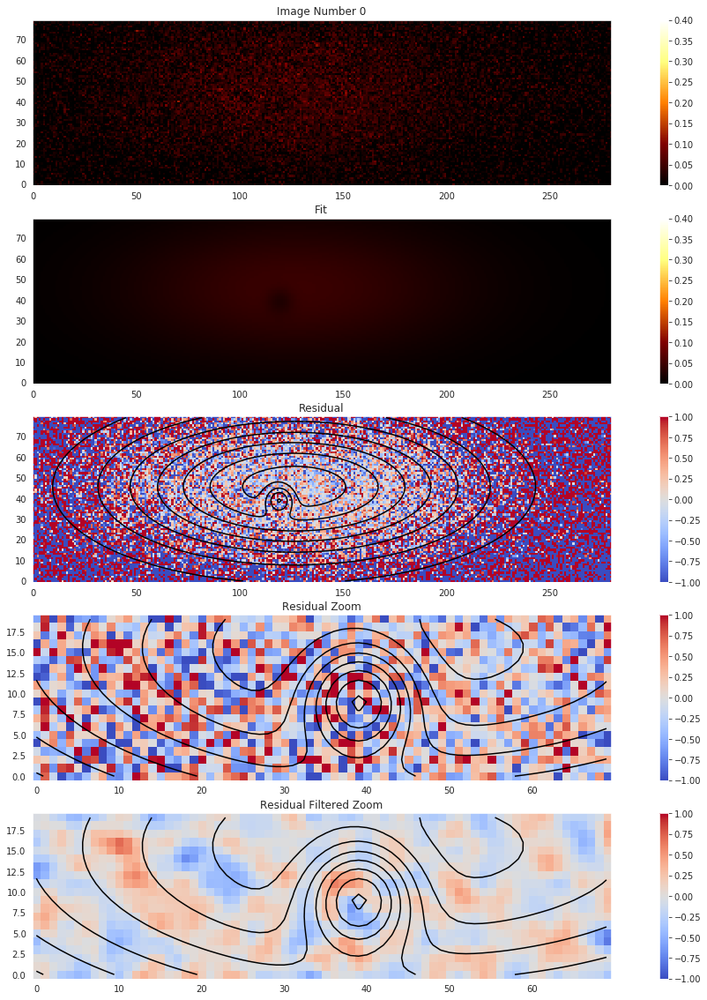

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 133
    # data points      = 22400
    # variables        = 10
    chi-square         = 11.5995405
    reduced chi-square = 5.1807e-04
    Akaike info crit   = -169455.057
    Bayesian info crit = -169374.889
[[Variables]]
    amplitude1:  0.06258090 +/- 6.0736e-04 (0.97%) (init = 0.1)
    xo1:         45.0954750 +/- 0.21143178 (0.47%) (init = 43)
    yo1:         128.032285 +/- 0.46768932 (0.37%) (init = 128)
    sigma_x1:    24.2418061 +/- 0.26251534 (1.08%) (init = 27)
    sigma_y1:    58.7686922 +/- 0.49744752 (0.85%) (init = 66)
    theta1:     -0.00676223 +/- 0.00596731 (88.24%) (init = 0)
    amplitude2: -0.02014321 +/- 0.00300197 (14.90%) (init = 0)
    xo2:         42.0493043 +/- 0.90972530 (2.16%) (init = 39)
    yo2:         114.743760 +/- 0.89616677 (0.78%) (init = 117)
    sigma_x2:    6.08031883 +/- 0.69558269 (11.44%) (init = 3)
    sigma_y2:    6.08031883 +/- 0

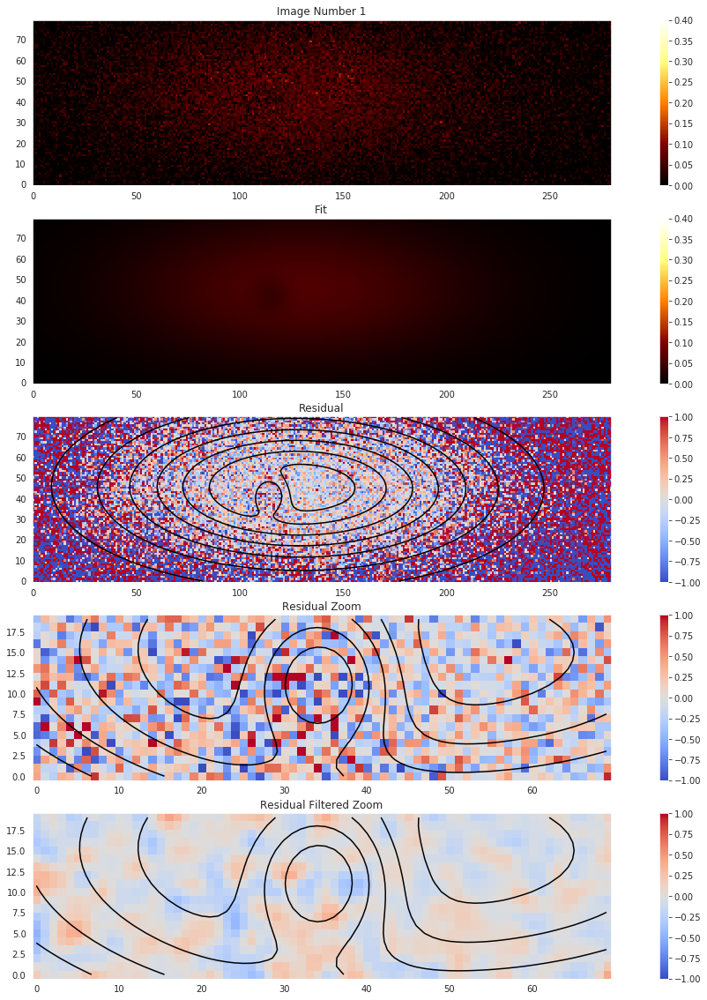

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 144
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.6238994
    reduced chi-square = 5.6382e-04
    Akaike info crit   = -167559.427
    Bayesian info crit = -167479.259
[[Variables]]
    amplitude1:  0.06430352 +/- 6.5593e-04 (1.02%) (init = 0.1)
    xo1:         44.8395456 +/- 0.21966068 (0.49%) (init = 43)
    yo1:         125.442868 +/- 0.46908536 (0.37%) (init = 128)
    sigma_x1:    24.7596203 +/- 0.27698328 (1.12%) (init = 27)
    sigma_y1:    58.8860359 +/- 0.51260203 (0.87%) (init = 66)
    theta1:     -0.01023804 +/- 0.00620282 (60.59%) (init = 0)
    amplitude2: -0.01943948 +/- 0.00286027 (14.71%) (init = 0)
    xo2:         41.5748360 +/- 0.99808139 (2.40%) (init = 39)
    yo2:         116.981730 +/- 0.97590452 (0.83%) (init = 117)
    sigma_x2:    6.66413242 +/- 0.76433019 (11.47%) (init = 3)
    sigma_y2:    6.66413242 +/- 0

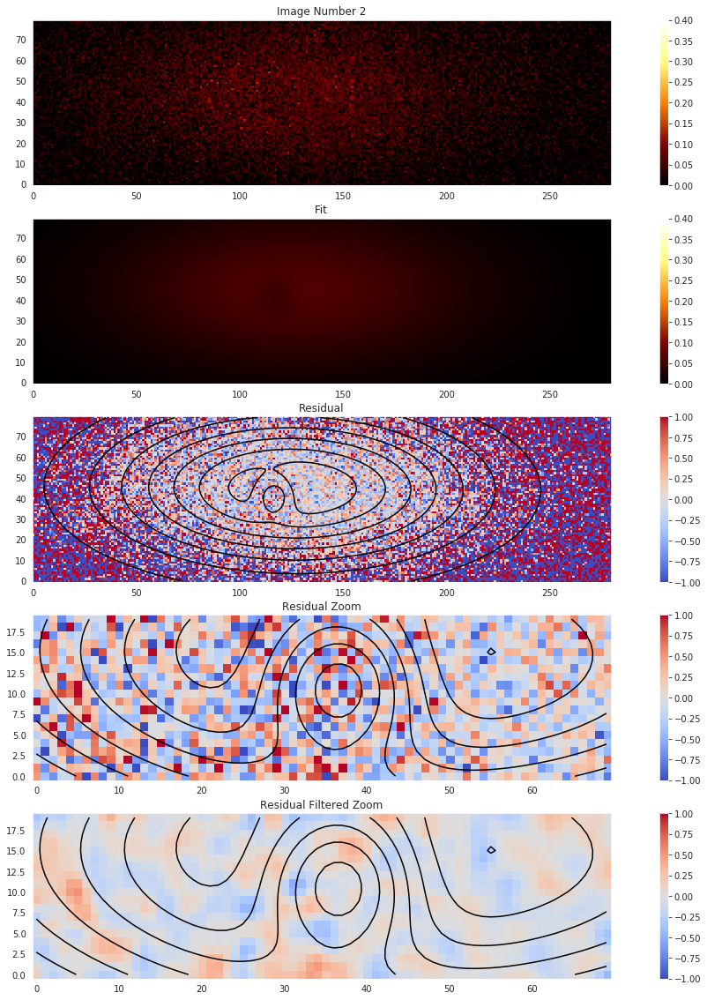

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 100
    # data points      = 22400
    # variables        = 10
    chi-square         = 11.8862682
    reduced chi-square = 5.3087e-04
    Akaike info crit   = -168908.087
    Bayesian info crit = -168827.918
[[Variables]]
    amplitude1:  0.06748347 +/- 5.6973e-04 (0.84%) (init = 0.1)
    xo1:         44.6204173 +/- 0.20103166 (0.45%) (init = 43)
    yo1:         129.748043 +/- 0.43427604 (0.33%) (init = 128)
    sigma_x1:    25.1871218 +/- 0.25569292 (1.02%) (init = 27)
    sigma_y1:    60.2004032 +/- 0.46056273 (0.77%) (init = 66)
    theta1:     -0.00878931 +/- 0.00561769 (63.92%) (init = 0)
    amplitude2: -0.02579442 +/- 0.00366207 (14.20%) (init = 0)
    xo2:         41.8435355 +/- 0.71437743 (1.71%) (init = 39)
    yo2:         118.331659 +/- 0.70940089 (0.60%) (init = 117)
    sigma_x2:    5.04054128 +/- 0.53668995 (10.65%) (init = 3)
    sigma_y2:    5.04054128 +/- 0

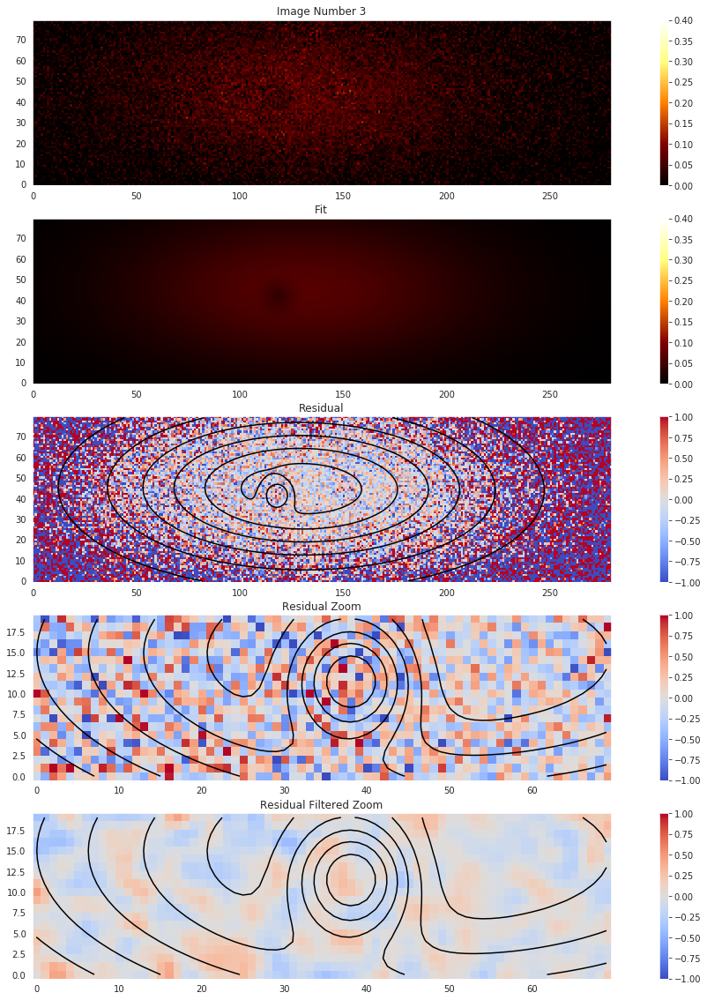

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 78
    # data points      = 22400
    # variables        = 10
    chi-square         = 14.0331117
    reduced chi-square = 6.2676e-04
    Akaike info crit   = -165188.883
    Bayesian info crit = -165108.715
[[Variables]]
    amplitude1:  0.07117973 +/- 6.4510e-04 (0.91%) (init = 0.1)
    xo1:         44.3695045 +/- 0.20263220 (0.46%) (init = 43)
    yo1:         131.308507 +/- 0.45852808 (0.35%) (init = 128)
    sigma_x1:    24.6928860 +/- 0.25482275 (1.03%) (init = 27)
    sigma_y1:    60.9179678 +/- 0.48646396 (0.80%) (init = 66)
    theta1:      0.00395302 +/- 0.00551170 (139.43%) (init = 0)
    amplitude2: -0.02363271 +/- 0.00327606 (13.86%) (init = 0)
    xo2:         41.2417566 +/- 0.85423340 (2.07%) (init = 39)
    yo2:         115.251214 +/- 0.83990970 (0.73%) (init = 117)
    sigma_x2:    6.11299271 +/- 0.65116050 (10.65%) (init = 3)
    sigma_y2:    6.11299271 +/- 0

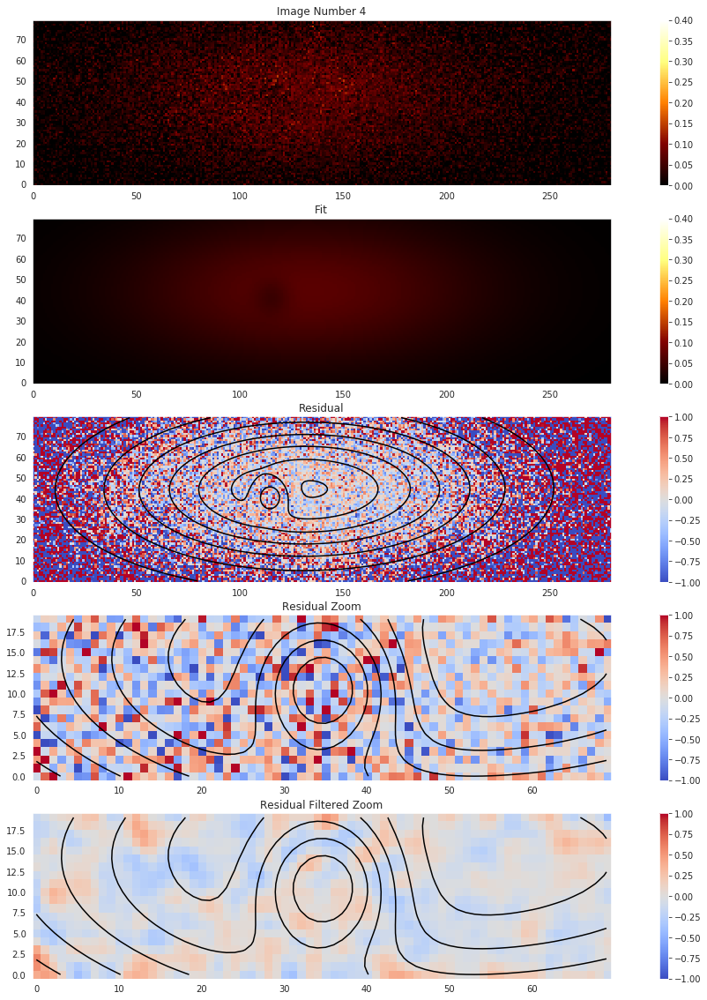

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 135
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.8645924
    reduced chi-square = 5.7457e-04
    Akaike info crit   = -167136.359
    Bayesian info crit = -167056.191
[[Variables]]
    amplitude1:  0.07712936 +/- 5.9104e-04 (0.77%) (init = 0.1)
    xo1:         44.6330504 +/- 0.18472496 (0.41%) (init = 43)
    yo1:         130.043154 +/- 0.39872974 (0.31%) (init = 128)
    sigma_x1:    25.3681543 +/- 0.23367597 (0.92%) (init = 27)
    sigma_y1:    61.1083197 +/- 0.42375249 (0.69%) (init = 66)
    theta1:     -0.01039267 +/- 0.00502876 (48.39%) (init = 0)
    amplitude2: -0.02326892 +/- 0.00347532 (14.94%) (init = 0)
    xo2:         38.6130724 +/- 0.82943014 (2.15%) (init = 39)
    yo2:         116.184261 +/- 0.82307969 (0.71%) (init = 117)
    sigma_x2:    5.50965579 +/- 0.62404359 (11.33%) (init = 3)
    sigma_y2:    5.50965579 +/- 0

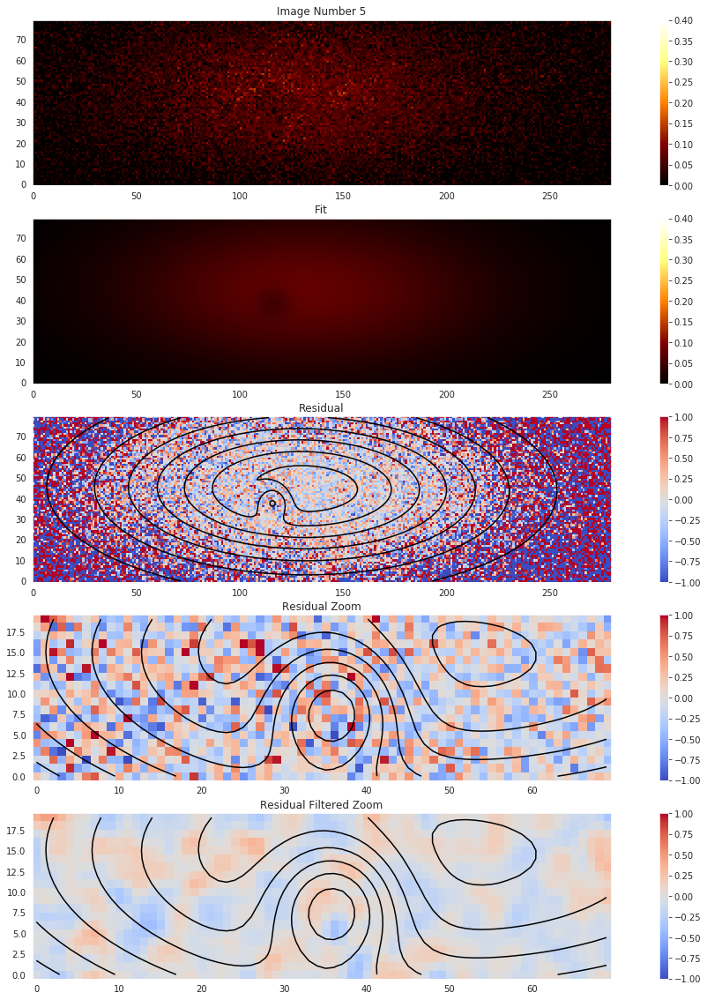

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 101
    # data points      = 22400
    # variables        = 10
    chi-square         = 11.6433512
    reduced chi-square = 5.2002e-04
    Akaike info crit   = -169370.613
    Bayesian info crit = -169290.445
[[Variables]]
    amplitude1:  0.07869853 +/- 5.8345e-04 (0.74%) (init = 0.1)
    xo1:         44.3116826 +/- 0.16987109 (0.38%) (init = 43)
    yo1:         124.403252 +/- 0.37713885 (0.30%) (init = 128)
    sigma_x1:    25.4639619 +/- 0.21795077 (0.86%) (init = 27)
    sigma_y1:    62.9267985 +/- 0.41602286 (0.66%) (init = 66)
    theta1:     -8.6913e-04 +/- 0.00446689 (513.95%) (init = 0)
    amplitude2: -0.02327592 +/- 0.00291863 (12.54%) (init = 0)
    xo2:         40.2873156 +/- 0.79273785 (1.97%) (init = 39)
    yo2:         116.198628 +/- 0.78355151 (0.67%) (init = 117)
    sigma_x2:    6.23111565 +/- 0.60799479 (9.76%) (init = 3)
    sigma_y2:    6.23111565 +/- 0

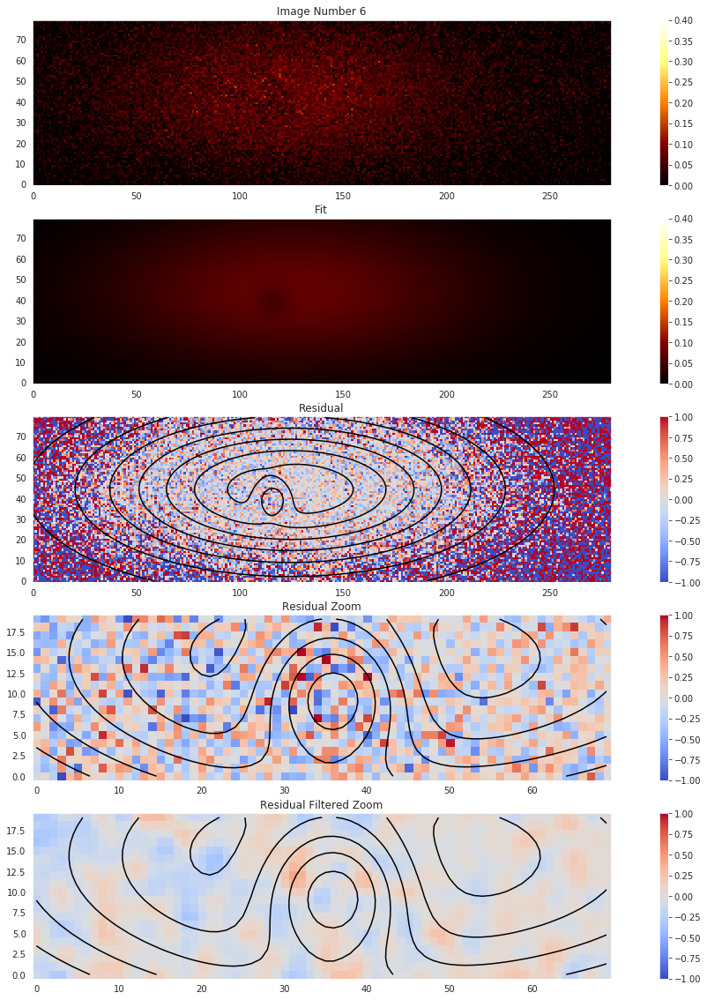

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 167
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.5702872
    reduced chi-square = 6.0609e-04
    Akaike info crit   = -165940.113
    Bayesian info crit = -165859.944
[[Variables]]
    amplitude1:  0.08153079 +/- 6.2129e-04 (0.76%) (init = 0.1)
    xo1:         44.5791682 +/- 0.17753373 (0.40%) (init = 43)
    yo1:         127.486943 +/- 0.39326274 (0.31%) (init = 128)
    sigma_x1:    25.5409654 +/- 0.22825460 (0.89%) (init = 27)
    sigma_y1:    62.9827299 +/- 0.42854951 (0.68%) (init = 66)
    theta1:      8.3472e-04 +/- 0.00466590 (558.98%) (init = 0)
    amplitude2: -0.02293487 +/- 0.00322782 (14.07%) (init = 0)
    xo2:         41.1325970 +/- 0.86696506 (2.11%) (init = 39)
    yo2:         116.257906 +/- 0.85924393 (0.74%) (init = 117)
    sigma_x2:    6.08804226 +/- 0.66139835 (10.86%) (init = 3)
    sigma_y2:    6.08804226 +/- 

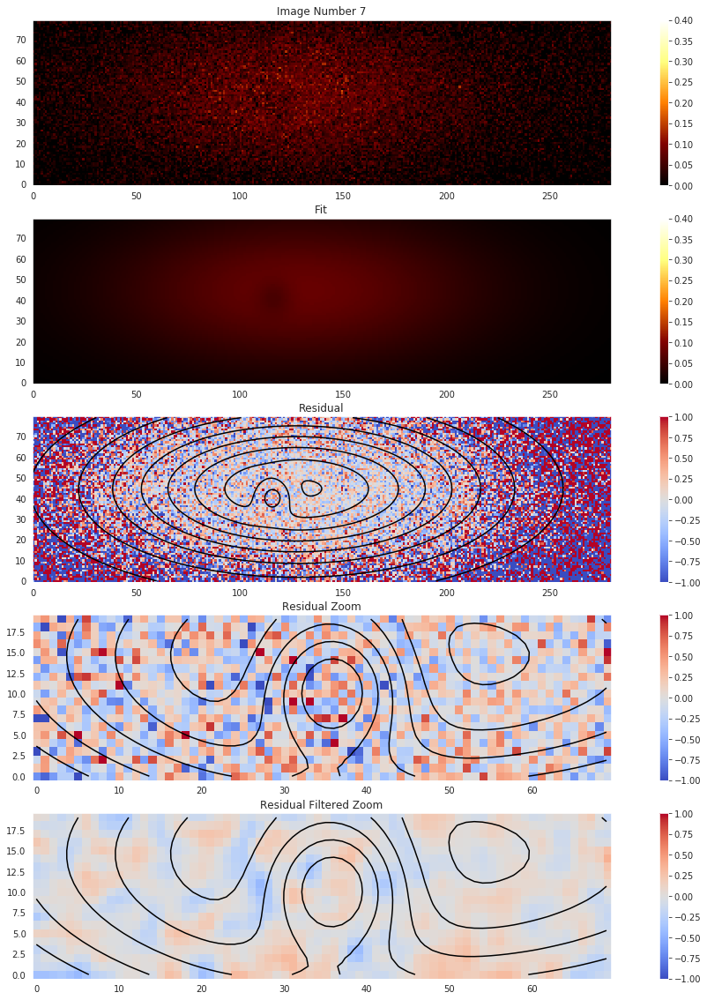

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 78
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.1509333
    reduced chi-square = 5.8736e-04
    Akaike info crit   = -166643.247
    Bayesian info crit = -166563.078
[[Variables]]
    amplitude1:  0.09479799 +/- 6.0302e-04 (0.64%) (init = 0.1)
    xo1:         44.3809792 +/- 0.15072188 (0.34%) (init = 43)
    yo1:         128.966709 +/- 0.33079222 (0.26%) (init = 128)
    sigma_x1:    25.6383065 +/- 0.19463781 (0.76%) (init = 27)
    sigma_y1:    62.3997670 +/- 0.35581458 (0.57%) (init = 66)
    theta1:      0.00150113 +/- 0.00403244 (268.63%) (init = 0)
    amplitude2: -0.02755868 +/- 0.00334129 (12.12%) (init = 0)
    xo2:         41.5140972 +/- 0.70800534 (1.71%) (init = 39)
    yo2:         115.713689 +/- 0.70221644 (0.61%) (init = 117)
    sigma_x2:    5.80538738 +/- 0.53556854 (9.23%) (init = 3)
    sigma_y2:    5.80538738 +/- 0.

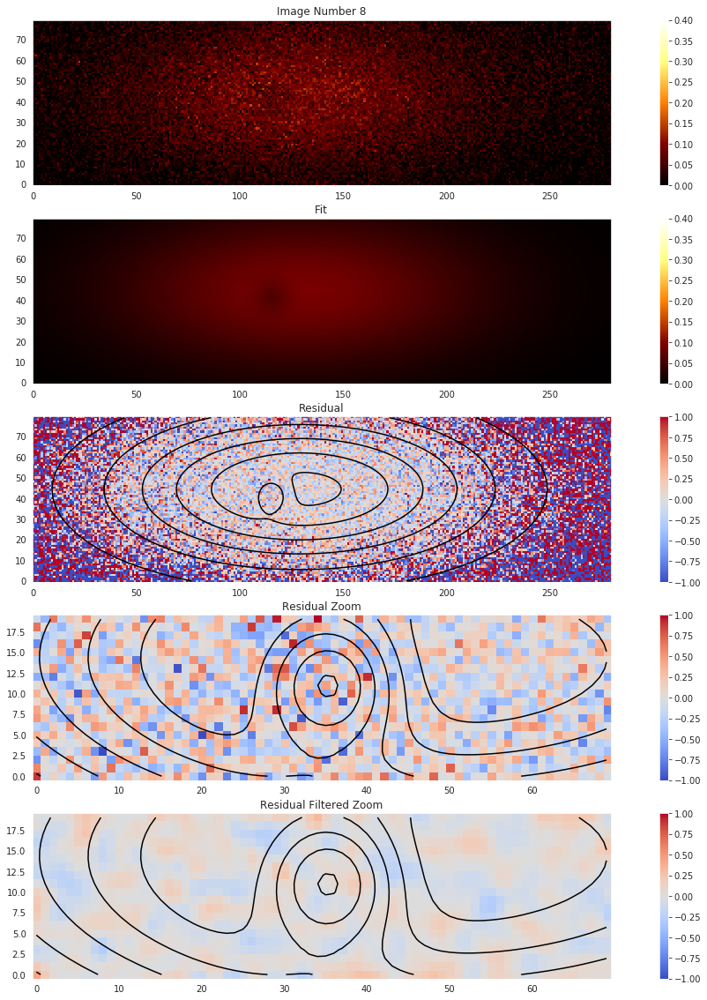

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 111
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.3348271
    reduced chi-square = 5.5091e-04
    Akaike info crit   = -168078.325
    Bayesian info crit = -167998.157
[[Variables]]
    amplitude1:  0.10012584 +/- 5.8045e-04 (0.58%) (init = 0.1)
    xo1:         44.3121105 +/- 0.13699176 (0.31%) (init = 43)
    yo1:         127.913327 +/- 0.30536817 (0.24%) (init = 128)
    sigma_x1:    25.5816952 +/- 0.17633916 (0.69%) (init = 27)
    sigma_y1:    63.2534696 +/- 0.33149030 (0.52%) (init = 66)
    theta1:     -0.00381370 +/- 0.00359685 (94.31%) (init = 0)
    amplitude2: -0.03072372 +/- 0.00325433 (10.59%) (init = 0)
    xo2:         40.7711533 +/- 0.61742651 (1.51%) (init = 39)
    yo2:         116.491361 +/- 0.61233591 (0.53%) (init = 117)
    sigma_x2:    5.74109708 +/- 0.46755709 (8.14%) (init = 3)
    sigma_y2:    5.74109708 +/- 0.

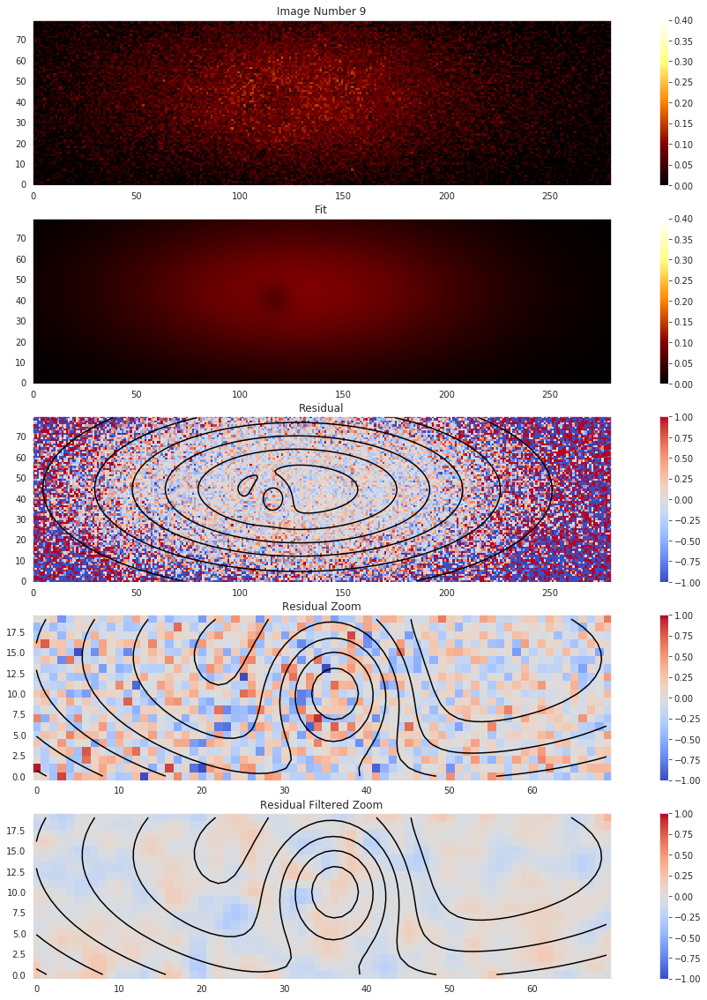

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 145
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.5031599
    reduced chi-square = 5.5843e-04
    Akaike info crit   = -167774.700
    Bayesian info crit = -167694.532
[[Variables]]
    amplitude1:  0.10941245 +/- 5.4708e-04 (0.50%) (init = 0.1)
    xo1:         44.1855578 +/- 0.12843869 (0.29%) (init = 43)
    yo1:         127.247484 +/- 0.27818120 (0.22%) (init = 128)
    sigma_x1:    26.1760134 +/- 0.16640804 (0.64%) (init = 27)
    sigma_y1:    63.4670629 +/- 0.29892278 (0.47%) (init = 66)
    theta1:     -0.00426100 +/- 0.00339738 (79.73%) (init = 0)
    amplitude2: -0.03905125 +/- 0.00414525 (10.61%) (init = 0)
    xo2:         38.7203646 +/- 0.48633604 (1.26%) (init = 39)
    yo2:         117.976559 +/- 0.48492413 (0.41%) (init = 117)
    sigma_x2:    4.53527978 +/- 0.35903100 (7.92%) (init = 3)
    sigma_y2:    4.53527978 +/- 0.

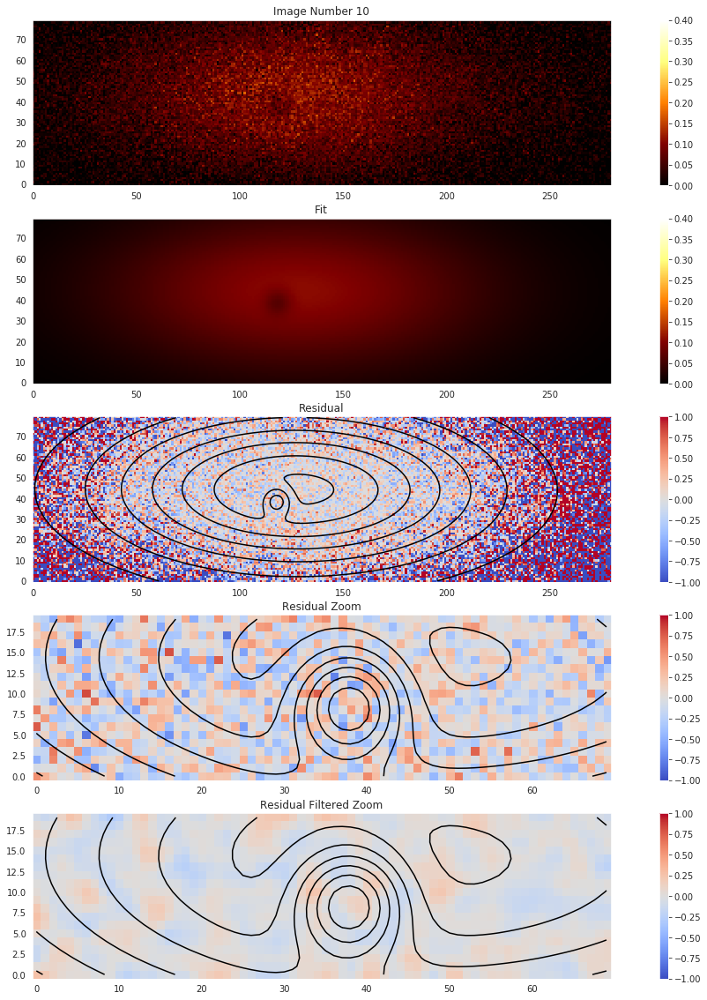

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 56
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.7384298
    reduced chi-square = 5.6893e-04
    Akaike info crit   = -167357.120
    Bayesian info crit = -167276.952
[[Variables]]
    amplitude1:  0.10642757 +/- 5.5821e-04 (0.52%) (init = 0.1)
    xo1:         44.5010480 +/- 0.13336317 (0.30%) (init = 43)
    yo1:         129.130702 +/- 0.29116050 (0.23%) (init = 128)
    sigma_x1:    26.1870676 +/- 0.17297170 (0.66%) (init = 27)
    sigma_y1:    64.1836563 +/- 0.31387867 (0.49%) (init = 66)
    theta1:     -0.00687120 +/- 0.00346064 (50.36%) (init = 0)
    amplitude2: -0.02914068 +/- 0.00379592 (13.03%) (init = 0)
    xo2:         39.3906799 +/- 0.65746435 (1.67%) (init = 39)
    yo2:         117.121340 +/- 0.65464485 (0.56%) (init = 117)
    sigma_x2:    5.01117145 +/- 0.48995505 (9.78%) (init = 3)
    sigma_y2:    5.01117145 +/- 0.4

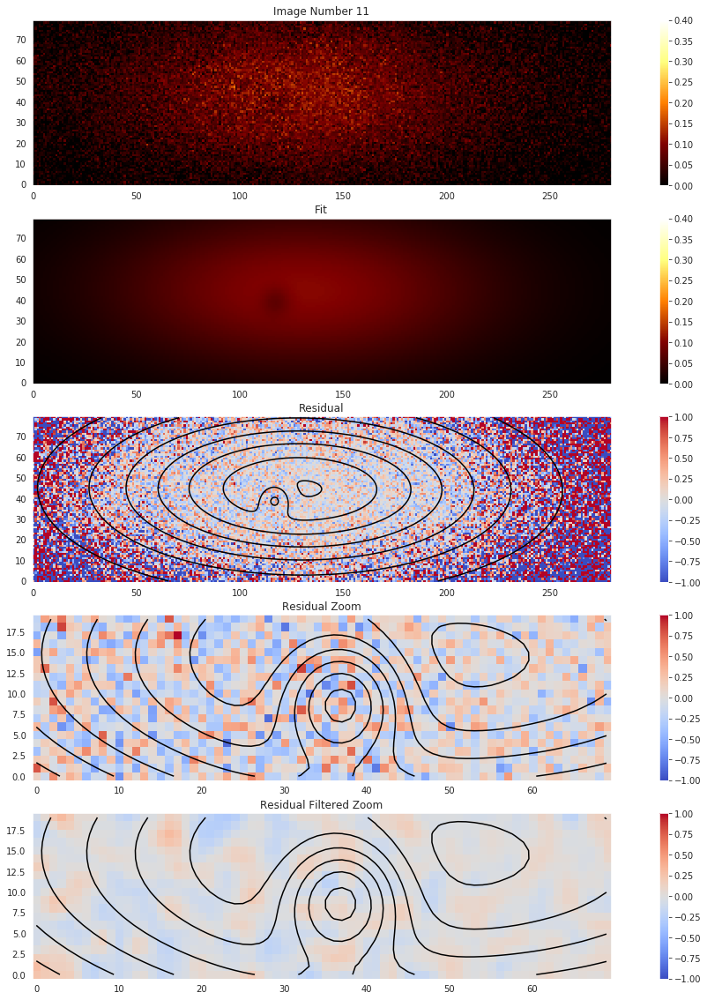

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 134
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.9034298
    reduced chi-square = 5.7630e-04
    Akaike info crit   = -167068.837
    Bayesian info crit = -166988.669
[[Variables]]
    amplitude1:  0.11232946 +/- 5.7619e-04 (0.51%) (init = 0.1)
    xo1:         44.4303003 +/- 0.12703630 (0.29%) (init = 43)
    yo1:         129.109374 +/- 0.27739489 (0.21%) (init = 128)
    sigma_x1:    26.0715709 +/- 0.16507961 (0.63%) (init = 27)
    sigma_y1:    63.6849092 +/- 0.29915987 (0.47%) (init = 66)
    theta1:     -0.00427287 +/- 0.00332536 (77.83%) (init = 0)
    amplitude2: -0.03527008 +/- 0.00352036 (9.98%) (init = 0)
    xo2:         40.2103715 +/- 0.54639043 (1.36%) (init = 39)
    yo2:         116.161939 +/- 0.54276102 (0.47%) (init = 117)
    sigma_x2:    5.45875380 +/- 0.41035883 (7.52%) (init = 3)
    sigma_y2:    5.45875380 +/- 0.4

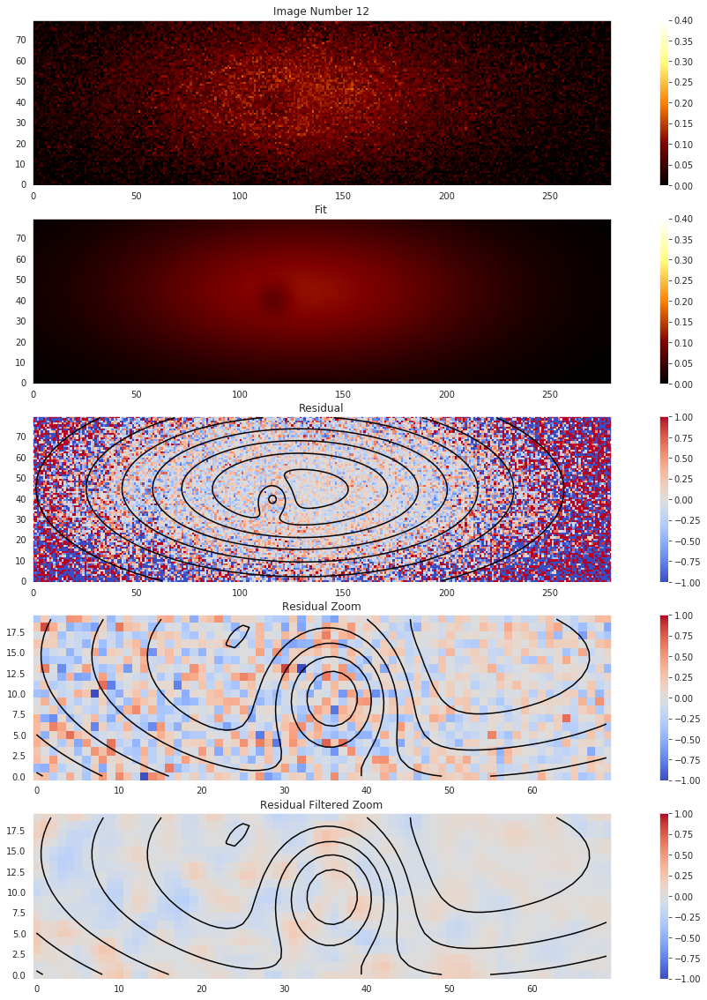

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 156
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.2300063
    reduced chi-square = 5.9089e-04
    Akaike info crit   = -166508.965
    Bayesian info crit = -166428.797
[[Variables]]
    amplitude1:  0.12190328 +/- 5.8925e-04 (0.48%) (init = 0.1)
    xo1:         44.2234156 +/- 0.11972463 (0.27%) (init = 43)
    yo1:         127.716314 +/- 0.25921278 (0.20%) (init = 128)
    sigma_x1:    26.4860113 +/- 0.15768756 (0.60%) (init = 27)
    sigma_y1:    64.6329358 +/- 0.28415428 (0.44%) (init = 66)
    theta1:     -5.1753e-04 +/- 0.00308720 (596.53%) (init = 0)
    amplitude2: -0.03558028 +/- 0.00331116 (9.31%) (init = 0)
    xo2:         39.7753658 +/- 0.54947395 (1.38%) (init = 39)
    yo2:         117.573890 +/- 0.54494875 (0.46%) (init = 117)
    sigma_x2:    5.87561256 +/- 0.41562785 (7.07%) (init = 3)
    sigma_y2:    5.87561256 +/- 0.

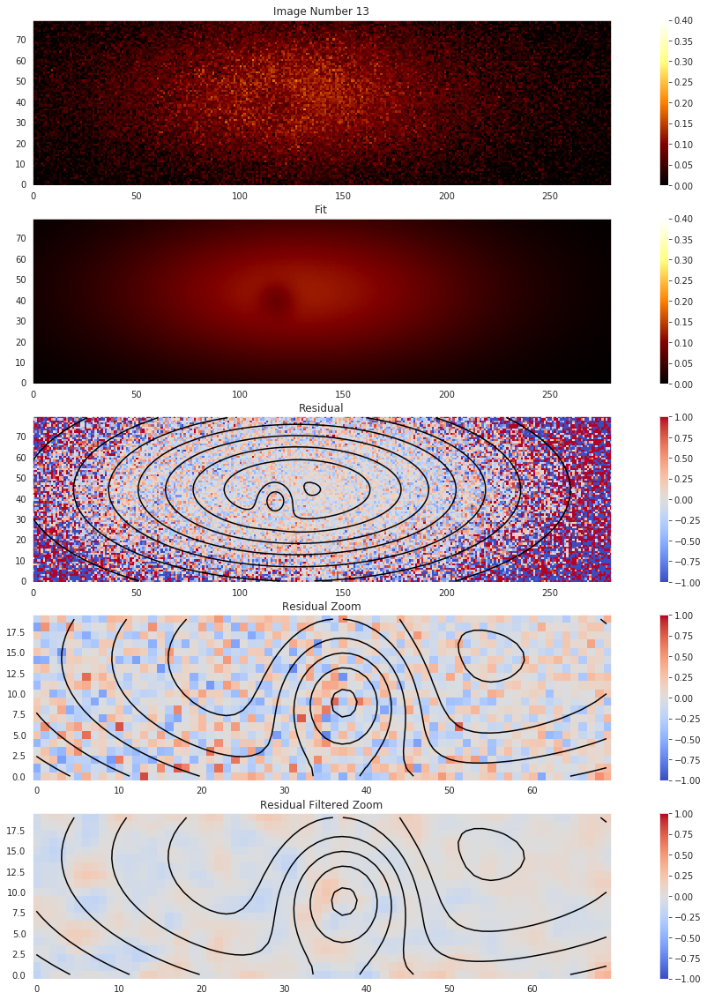

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 123
    # data points      = 22400
    # variables        = 10
    chi-square         = 11.5908736
    reduced chi-square = 5.1768e-04
    Akaike info crit   = -169471.800
    Bayesian info crit = -169391.632
[[Variables]]
    amplitude1:  0.12696113 +/- 5.4566e-04 (0.43%) (init = 0.1)
    xo1:         44.2353829 +/- 0.10698561 (0.24%) (init = 43)
    yo1:         127.785641 +/- 0.23349644 (0.18%) (init = 128)
    sigma_x1:    26.4334112 +/- 0.14080493 (0.53%) (init = 27)
    sigma_y1:    64.7680576 +/- 0.25497449 (0.39%) (init = 66)
    theta1:     -0.00160501 +/- 0.00275630 (171.73%) (init = 0)
    amplitude2: -0.03963370 +/- 0.00321718 (8.12%) (init = 0)
    xo2:         40.3115622 +/- 0.46232432 (1.15%) (init = 39)
    yo2:         116.643610 +/- 0.45915244 (0.39%) (init = 117)
    sigma_x2:    5.64058233 +/- 0.34868738 (6.18%) (init = 3)
    sigma_y2:    5.64058233 +/- 0.

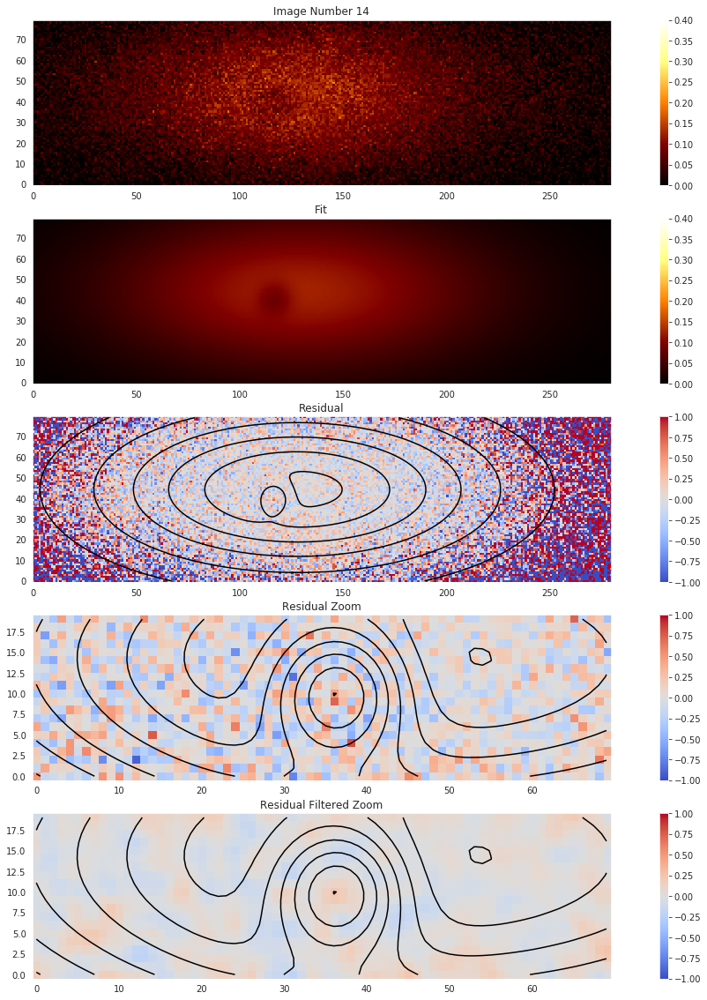

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 123
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.5337451
    reduced chi-square = 6.0445e-04
    Akaike info crit   = -166000.513
    Bayesian info crit = -165920.345
[[Variables]]
    amplitude1:  0.13033982 +/- 5.8912e-04 (0.45%) (init = 0.1)
    xo1:         44.1146191 +/- 0.11246697 (0.25%) (init = 43)
    yo1:         128.714258 +/- 0.24710064 (0.19%) (init = 128)
    sigma_x1:    26.5666523 +/- 0.14888343 (0.56%) (init = 27)
    sigma_y1:    65.4439214 +/- 0.27041774 (0.41%) (init = 66)
    theta1:      0.00242277 +/- 0.00286617 (118.30%) (init = 0)
    amplitude2: -0.03747858 +/- 0.00337256 (9.00%) (init = 0)
    xo2:         40.6586564 +/- 0.52778357 (1.30%) (init = 39)
    yo2:         116.215157 +/- 0.52354722 (0.45%) (init = 117)
    sigma_x2:    5.83229846 +/- 0.39821929 (6.83%) (init = 3)
    sigma_y2:    5.83229846 +/- 0.

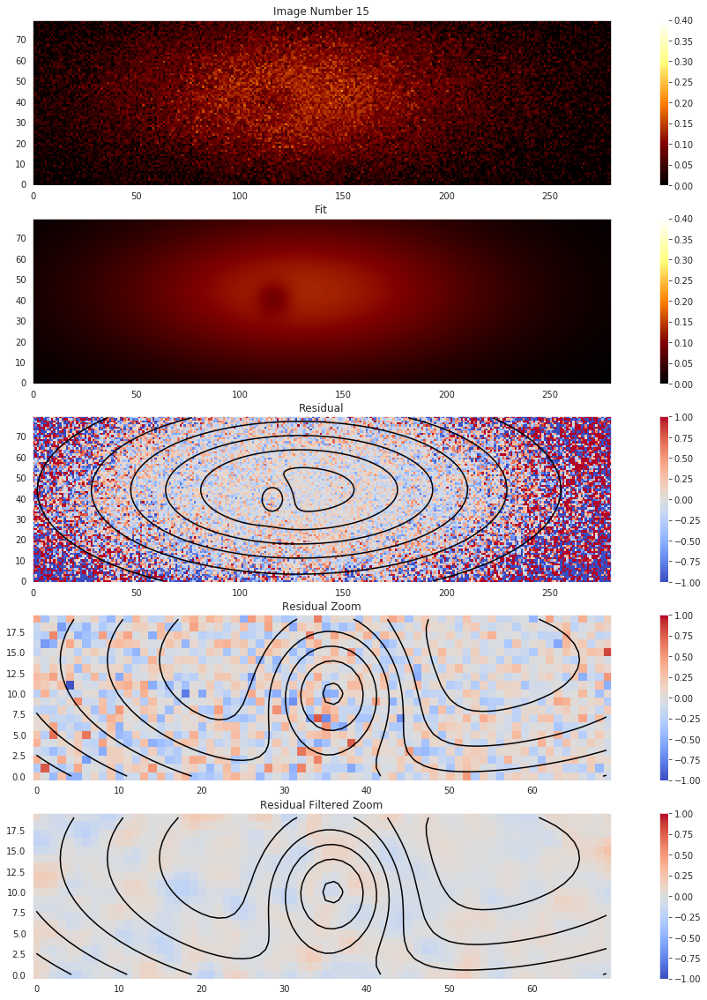

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.4736955
    reduced chi-square = 6.0177e-04
    Akaike info crit   = -166100.123
    Bayesian info crit = -166019.955
[[Variables]]
    amplitude1:  0.13144882 +/- 5.8632e-04 (0.45%) (init = 0.1)
    xo1:         44.0642140 +/- 0.11088704 (0.25%) (init = 43)
    yo1:         129.530292 +/- 0.24502155 (0.19%) (init = 128)
    sigma_x1:    26.5347060 +/- 0.14657403 (0.55%) (init = 27)
    sigma_y1:    65.6995026 +/- 0.26837241 (0.41%) (init = 66)
    theta1:      3.5168e-04 +/- 0.00280983 (798.98%) (init = 0)
    amplitude2: -0.03599654 +/- 0.00336605 (9.35%) (init = 0)
    xo2:         40.3381008 +/- 0.54828834 (1.36%) (init = 39)
    yo2:         117.044235 +/- 0.54420775 (0.46%) (init = 117)
    sigma_x2:    5.82640264 +/- 0.41386945 (7.10%) (init = 3)
    sigma_y2:    5.82640264 +/- 0.4

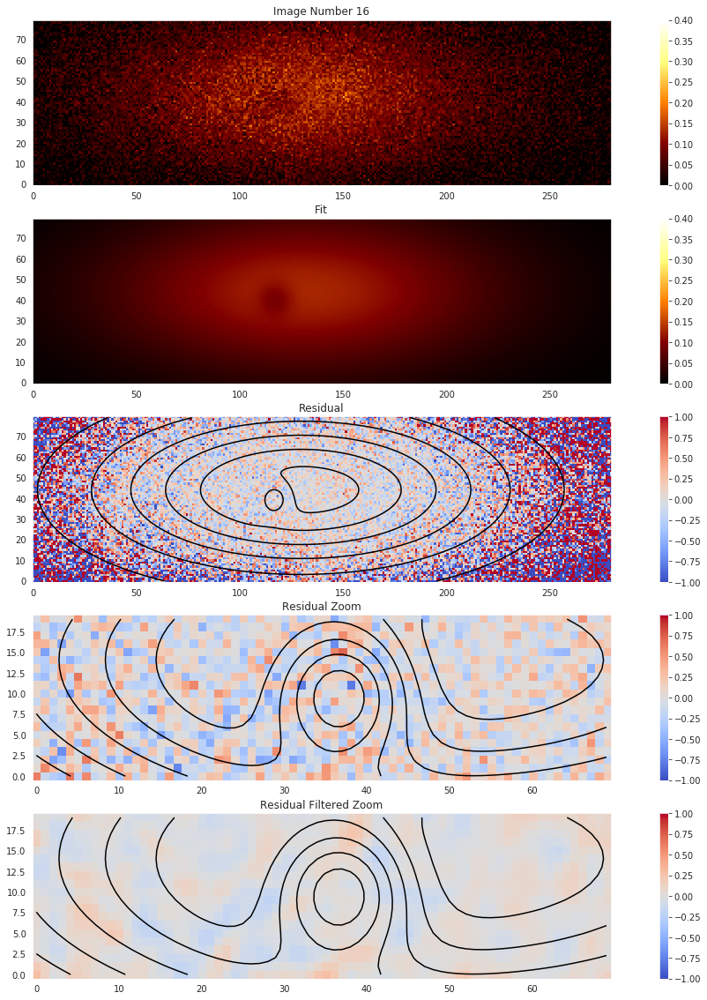

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 100
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.1331067
    reduced chi-square = 5.8656e-04
    Akaike info crit   = -166673.631
    Bayesian info crit = -166593.463
[[Variables]]
    amplitude1:  0.13602445 +/- 5.6470e-04 (0.42%) (init = 0.1)
    xo1:         44.0598295 +/- 0.10649315 (0.24%) (init = 43)
    yo1:         128.922145 +/- 0.23304741 (0.18%) (init = 128)
    sigma_x1:    26.7742728 +/- 0.14131917 (0.53%) (init = 27)
    sigma_y1:    65.8725425 +/- 0.25438269 (0.39%) (init = 66)
    theta1:      6.7326e-04 +/- 0.00270250 (401.41%) (init = 0)
    amplitude2: -0.04350112 +/- 0.00359609 (8.27%) (init = 0)
    xo2:         39.8790844 +/- 0.44643593 (1.12%) (init = 39)
    yo2:         116.690388 +/- 0.44396995 (0.38%) (init = 117)
    sigma_x2:    5.38837087 +/- 0.33452690 (6.21%) (init = 3)
    sigma_y2:    5.38837087 +/- 0.

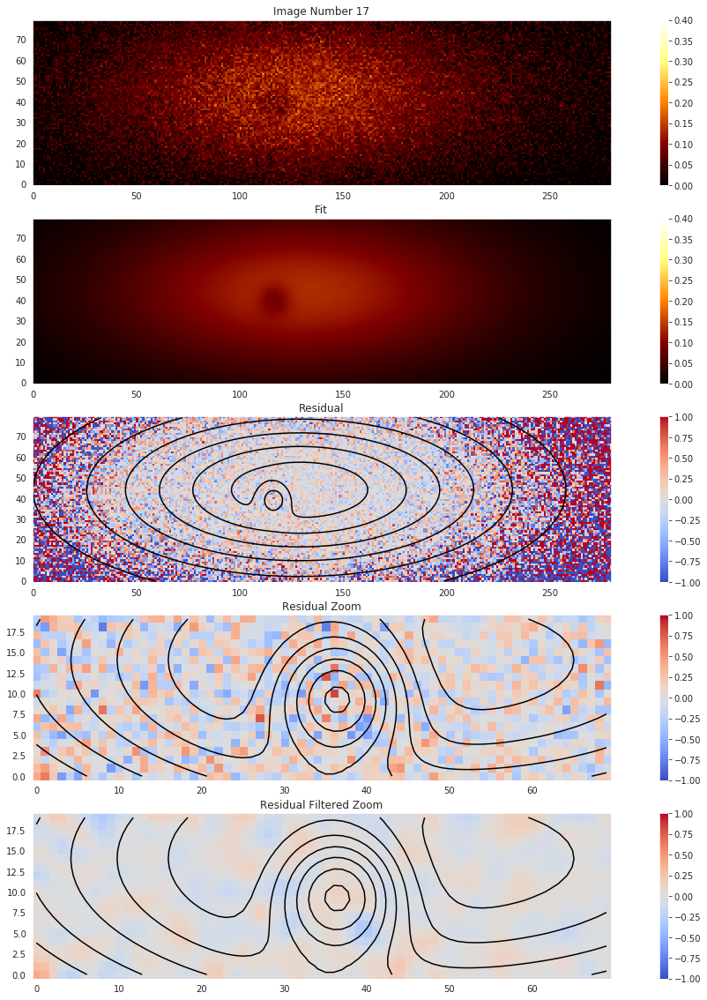

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 111
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.2370594
    reduced chi-square = 5.4654e-04
    Akaike info crit   = -168256.578
    Bayesian info crit = -168176.410
[[Variables]]
    amplitude1:  0.14638297 +/- 5.5594e-04 (0.38%) (init = 0.1)
    xo1:         44.0452899 +/- 0.09600505 (0.22%) (init = 43)
    yo1:         126.890170 +/- 0.20690915 (0.16%) (init = 128)
    sigma_x1:    26.6199193 +/- 0.12683521 (0.48%) (init = 27)
    sigma_y1:    64.6166857 +/- 0.22606737 (0.35%) (init = 66)
    theta1:      1.7595e-04 +/- 0.00249001 (1415.17%) (init = 0)
    amplitude2: -0.04294806 +/- 0.00341083 (7.94%) (init = 0)
    xo2:         39.3968282 +/- 0.43673961 (1.11%) (init = 39)
    yo2:         117.513207 +/- 0.43390432 (0.37%) (init = 117)
    sigma_x2:    5.48364689 +/- 0.32847446 (5.99%) (init = 3)
    sigma_y2:    5.48364689 +/- 0

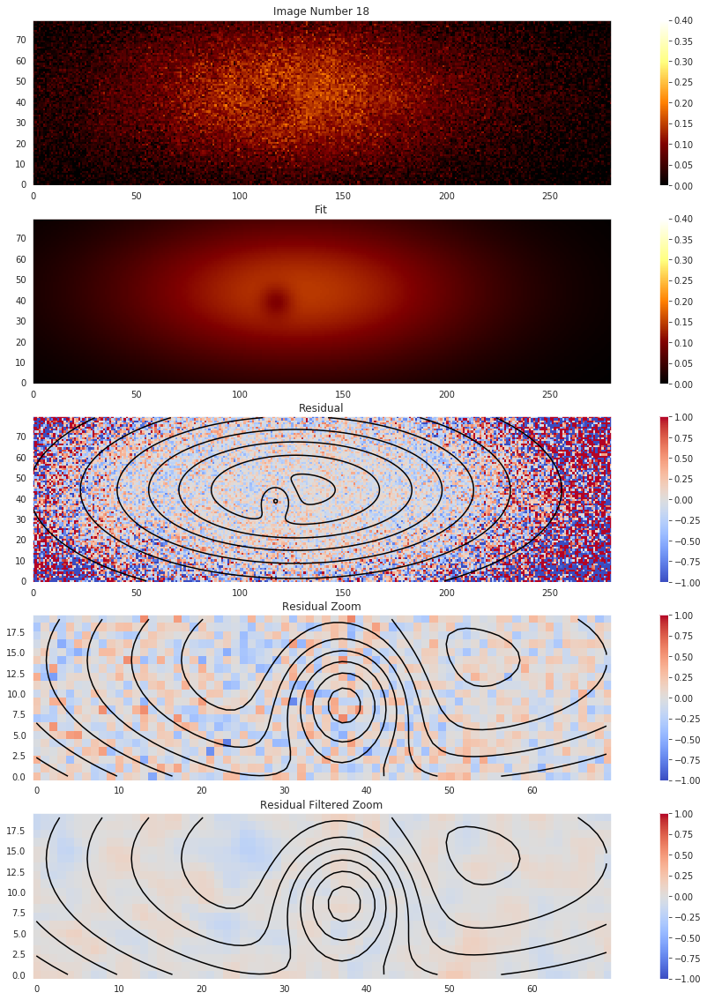

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 100
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.5585399
    reduced chi-square = 6.0556e-04
    Akaike info crit   = -165959.512
    Bayesian info crit = -165879.344
[[Variables]]
    amplitude1:  0.14806315 +/- 5.5673e-04 (0.38%) (init = 0.1)
    xo1:         44.0273712 +/- 0.09855501 (0.22%) (init = 43)
    yo1:         127.513973 +/- 0.21785714 (0.17%) (init = 128)
    sigma_x1:    26.6980849 +/- 0.12999731 (0.49%) (init = 27)
    sigma_y1:    66.1468948 +/- 0.23746745 (0.36%) (init = 66)
    theta1:     -9.8561e-04 +/- 0.00249482 (253.12%) (init = 0)
    amplitude2: -0.04800759 +/- 0.00426597 (8.89%) (init = 0)
    xo2:         39.5753265 +/- 0.40962755 (1.04%) (init = 39)
    yo2:         118.351127 +/- 0.40799800 (0.34%) (init = 117)
    sigma_x2:    4.61463984 +/- 0.30376414 (6.58%) (init = 3)
    sigma_y2:    4.61463984 +/- 0.

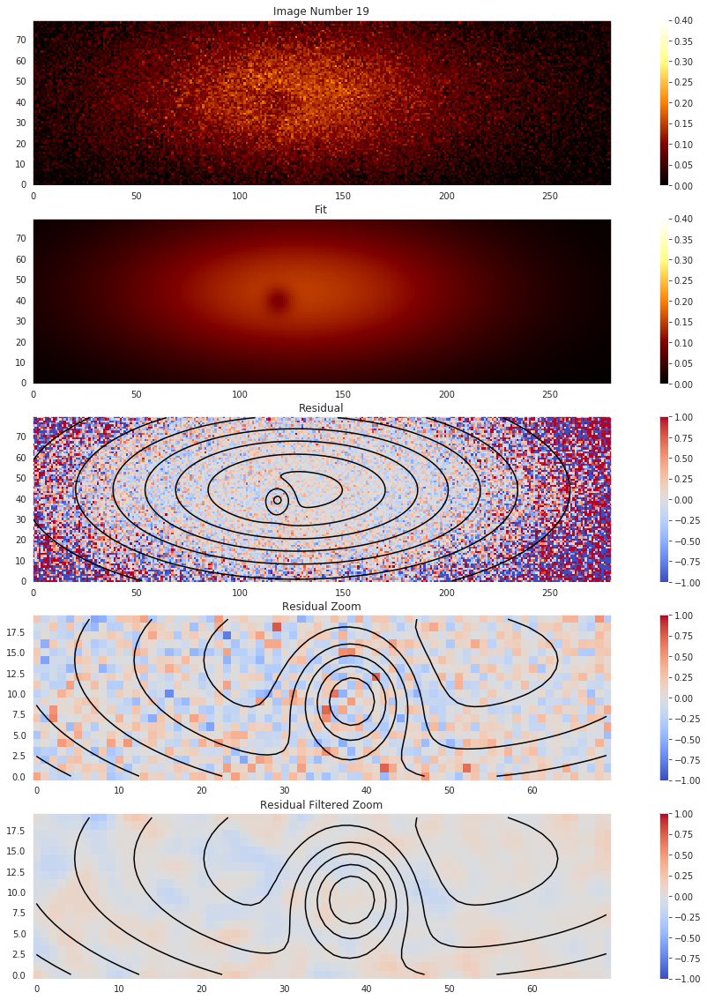

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 92
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.1556572
    reduced chi-square = 5.8757e-04
    Akaike info crit   = -166635.202
    Bayesian info crit = -166555.034
[[Variables]]
    amplitude1:  0.14482576 +/- 5.5603e-04 (0.38%) (init = 0.1)
    xo1:         44.1835698 +/- 0.09954030 (0.23%) (init = 43)
    yo1:         129.244360 +/- 0.22058787 (0.17%) (init = 128)
    sigma_x1:    26.7671498 +/- 0.13170707 (0.49%) (init = 27)
    sigma_y1:    66.6996977 +/- 0.24150622 (0.36%) (init = 66)
    theta1:     -0.00151546 +/- 0.00248512 (163.98%) (init = 0)
    amplitude2: -0.04402971 +/- 0.00376922 (8.56%) (init = 0)
    xo2:         39.7547940 +/- 0.44062701 (1.11%) (init = 39)
    yo2:         117.760522 +/- 0.43850479 (0.37%) (init = 117)
    sigma_x2:    5.14748947 +/- 0.32897323 (6.39%) (init = 3)
    sigma_y2:    5.14748947 +/- 0.3

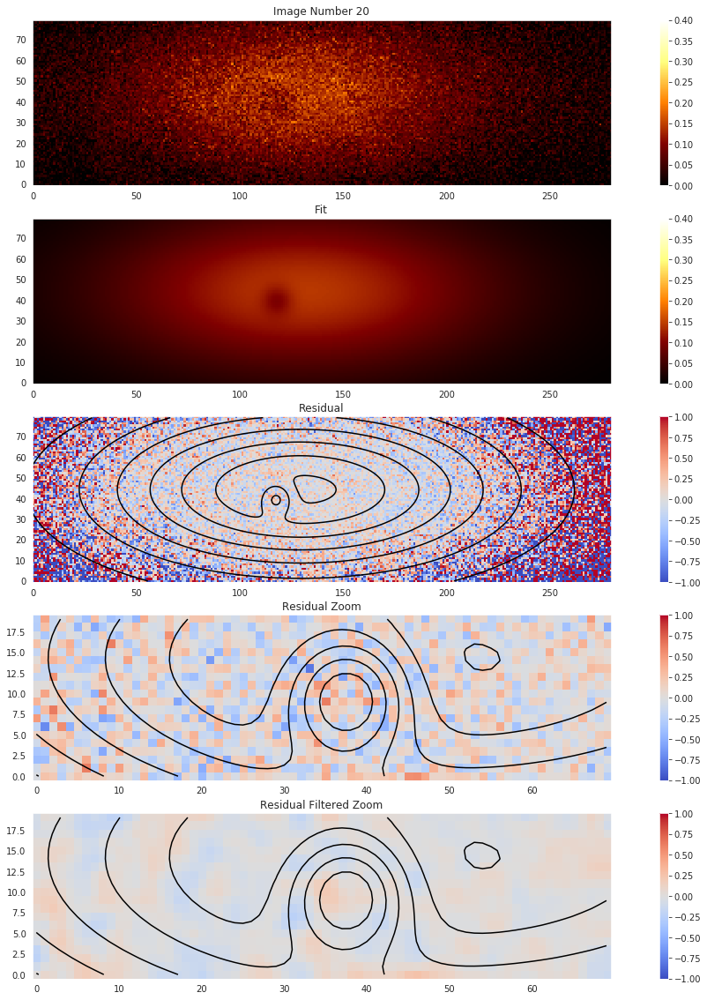

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 124
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.9800909
    reduced chi-square = 5.7973e-04
    Akaike info crit   = -166936.149
    Bayesian info crit = -166855.981
[[Variables]]
    amplitude1:  0.15691266 +/- 5.5703e-04 (0.35%) (init = 0.1)
    xo1:         44.0929688 +/- 0.09259011 (0.21%) (init = 43)
    yo1:         128.247658 +/- 0.20115662 (0.16%) (init = 128)
    sigma_x1:    27.1024759 +/- 0.12392816 (0.46%) (init = 27)
    sigma_y1:    66.5618120 +/- 0.22080612 (0.33%) (init = 66)
    theta1:      0.00423300 +/- 0.00232748 (54.98%) (init = 0)
    amplitude2: -0.04531988 +/- 0.00356623 (7.87%) (init = 0)
    xo2:         39.7993166 +/- 0.42705055 (1.07%) (init = 39)
    yo2:         116.847388 +/- 0.42479687 (0.36%) (init = 117)
    sigma_x2:    5.38387097 +/- 0.31995182 (5.94%) (init = 3)
    sigma_y2:    5.38387097 +/- 0.3

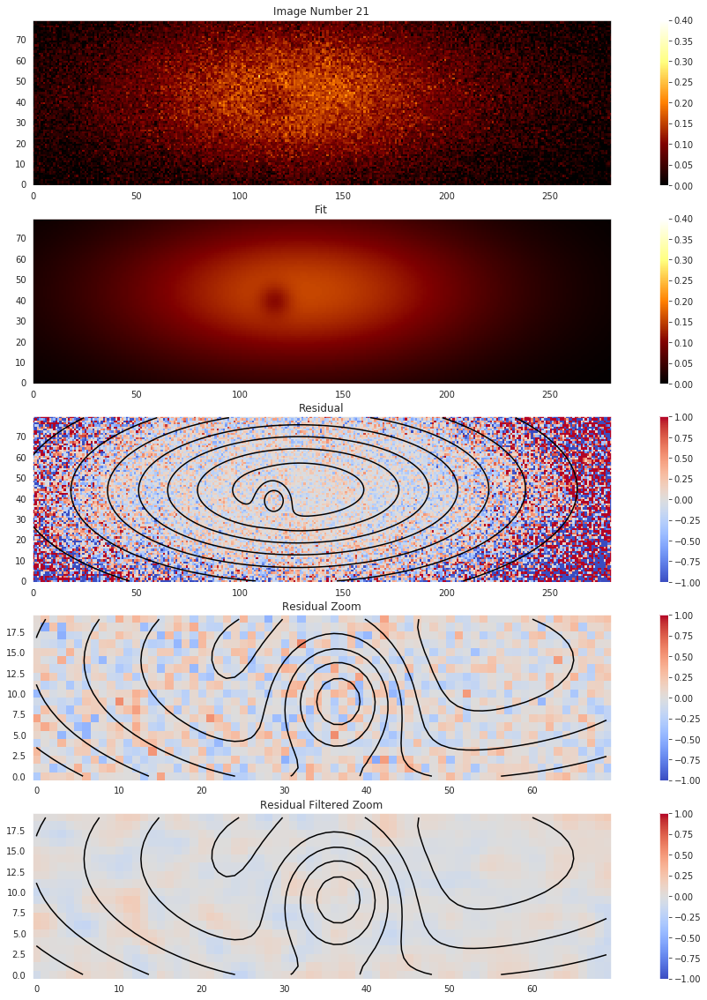

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 113
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.7346070
    reduced chi-square = 5.6876e-04
    Akaike info crit   = -167363.843
    Bayesian info crit = -167283.675
[[Variables]]
    amplitude1:  0.15774561 +/- 5.5153e-04 (0.35%) (init = 0.1)
    xo1:         44.0945868 +/- 0.09078165 (0.21%) (init = 43)
    yo1:         128.878792 +/- 0.19838474 (0.15%) (init = 128)
    sigma_x1:    27.0142176 +/- 0.12127483 (0.45%) (init = 27)
    sigma_y1:    66.6446657 +/- 0.21800258 (0.33%) (init = 66)
    theta1:     -0.00153813 +/- 0.00227660 (148.01%) (init = 0)
    amplitude2: -0.04220271 +/- 0.00356969 (8.46%) (init = 0)
    xo2:         40.0416959 +/- 0.45322569 (1.13%) (init = 39)
    yo2:         118.447877 +/- 0.45069531 (0.38%) (init = 117)
    sigma_x2:    5.34130830 +/- 0.33940878 (6.35%) (init = 3)
    sigma_y2:    5.34130830 +/- 0.

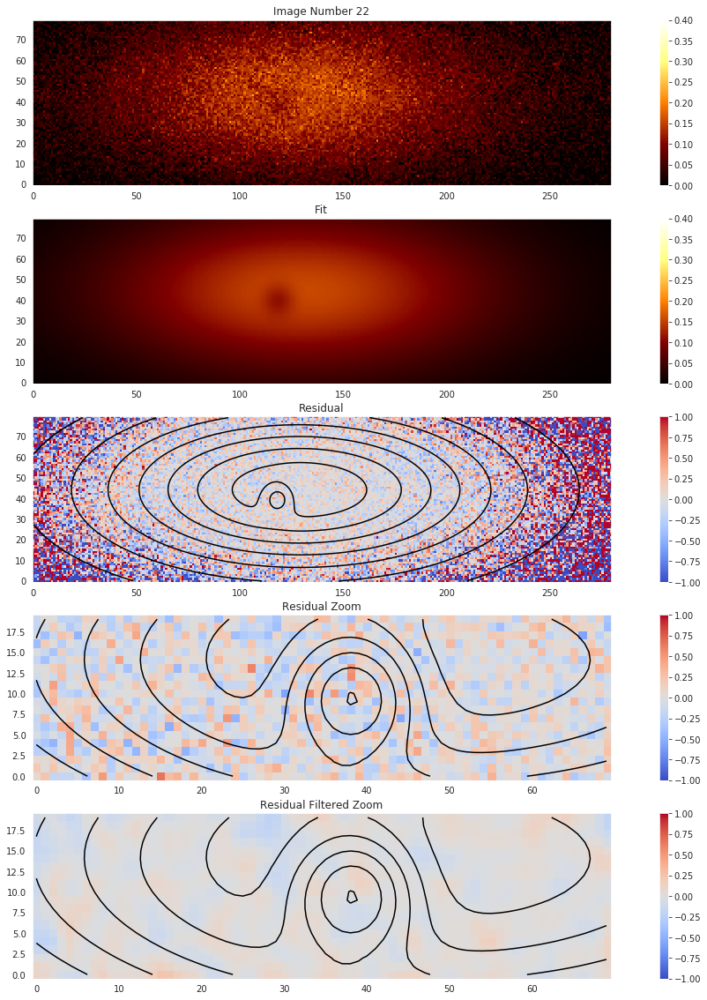

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 68
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.0937315
    reduced chi-square = 5.4014e-04
    Akaike info crit   = -168520.489
    Bayesian info crit = -168440.321
[[Variables]]
    amplitude1:  0.16519631 +/- 5.3056e-04 (0.32%) (init = 0.1)
    xo1:         43.9842350 +/- 0.08408625 (0.19%) (init = 43)
    yo1:         128.656892 +/- 0.18512866 (0.14%) (init = 128)
    sigma_x1:    27.0359877 +/- 0.11244806 (0.42%) (init = 27)
    sigma_y1:    66.9389810 +/- 0.20291632 (0.30%) (init = 66)
    theta1:     -8.5472e-04 +/- 0.00210381 (246.14%) (init = 0)
    amplitude2: -0.04902829 +/- 0.00363144 (7.41%) (init = 0)
    xo2:         40.3652373 +/- 0.38010676 (0.94%) (init = 39)
    yo2:         116.912312 +/- 0.37883339 (0.32%) (init = 117)
    sigma_x2:    5.10541969 +/- 0.28361850 (5.56%) (init = 3)
    sigma_y2:    5.10541969 +/- 0.2

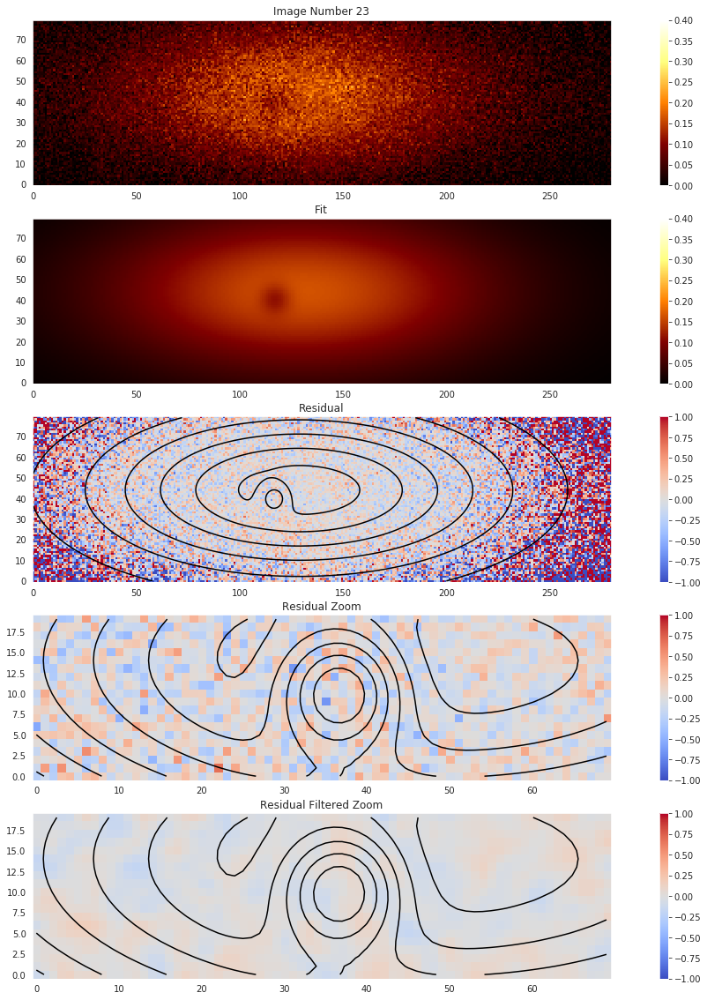

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 80
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.3820955
    reduced chi-square = 5.9768e-04
    Akaike info crit   = -166252.928
    Bayesian info crit = -166172.760
[[Variables]]
    amplitude1:  0.17293690 +/- 5.7026e-04 (0.33%) (init = 0.1)
    xo1:         44.0591729 +/- 0.08456239 (0.19%) (init = 43)
    yo1:         129.549012 +/- 0.18620896 (0.14%) (init = 128)
    sigma_x1:    26.9004256 +/- 0.11262042 (0.42%) (init = 27)
    sigma_y1:    66.7208581 +/- 0.20456944 (0.31%) (init = 66)
    theta1:     -8.0060e-04 +/- 0.00211147 (263.74%) (init = 0)
    amplitude2: -0.04767347 +/- 0.00349094 (7.32%) (init = 0)
    xo2:         39.7438485 +/- 0.41158871 (1.04%) (init = 39)
    yo2:         117.236223 +/- 0.40894908 (0.35%) (init = 117)
    sigma_x2:    5.60358185 +/- 0.30914133 (5.52%) (init = 3)
    sigma_y2:    5.60358185 +/- 0.3

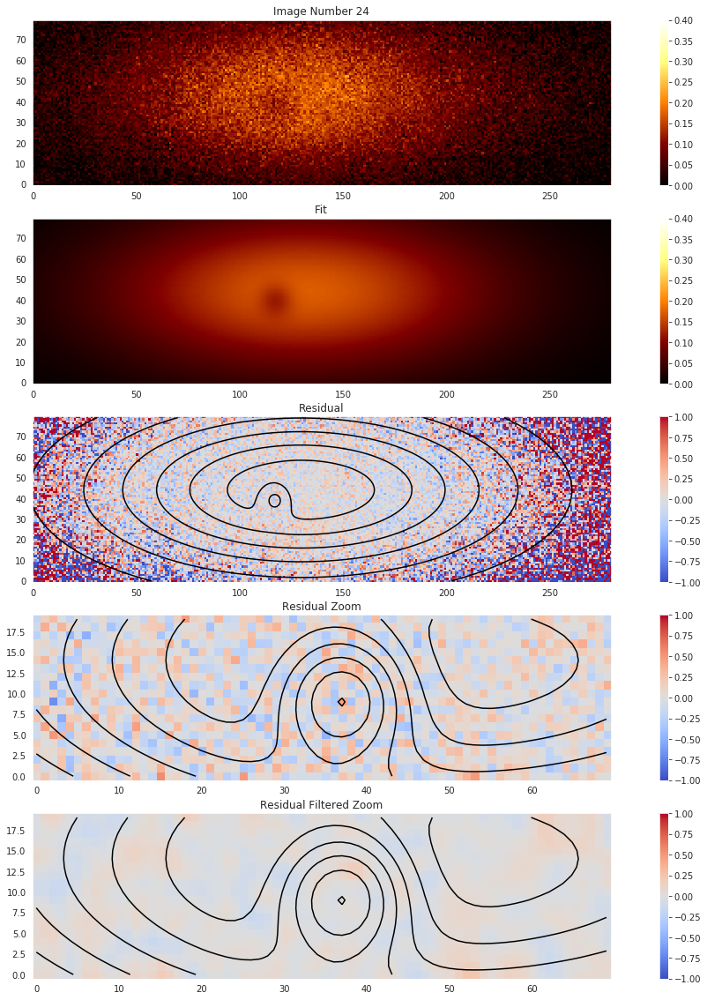

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 102
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.1787882
    reduced chi-square = 5.8860e-04
    Akaike info crit   = -166595.851
    Bayesian info crit = -166515.683
[[Variables]]
    amplitude1:  0.17274640 +/- 5.5569e-04 (0.32%) (init = 0.1)
    xo1:         44.0314141 +/- 0.08387768 (0.19%) (init = 43)
    yo1:         127.800746 +/- 0.18504563 (0.14%) (init = 128)
    sigma_x1:    26.9703680 +/- 0.11172698 (0.41%) (init = 27)
    sigma_y1:    67.0216908 +/- 0.20372081 (0.30%) (init = 66)
    theta1:     -0.00256091 +/- 0.00208974 (81.60%) (init = 0)
    amplitude2: -0.05264699 +/- 0.00374825 (7.12%) (init = 0)
    xo2:         39.5466643 +/- 0.37036476 (0.94%) (init = 39)
    yo2:         118.053991 +/- 0.36871791 (0.31%) (init = 117)
    sigma_x2:    5.15677127 +/- 0.27634611 (5.36%) (init = 3)
    sigma_y2:    5.15677127 +/- 0.2

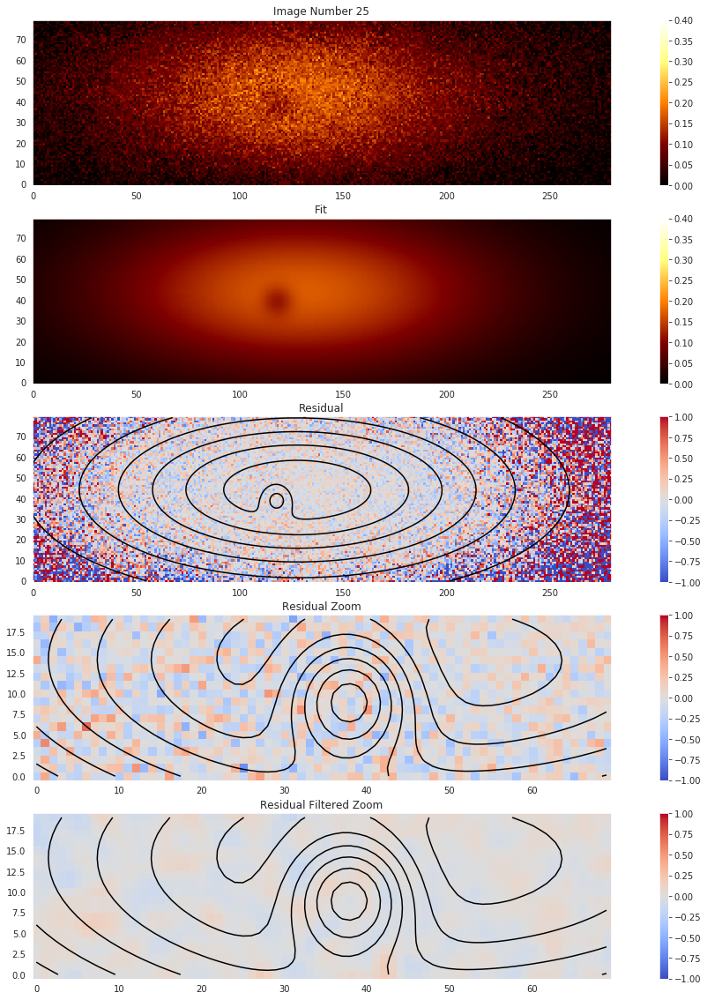

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 56
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.8613669
    reduced chi-square = 6.1909e-04
    Akaike info crit   = -165464.718
    Bayesian info crit = -165384.550
[[Variables]]
    amplitude1:  0.17780966 +/- 5.6067e-04 (0.32%) (init = 0.1)
    xo1:         44.1161606 +/- 0.08401576 (0.19%) (init = 43)
    yo1:         127.912142 +/- 0.18393773 (0.14%) (init = 128)
    sigma_x1:    27.1217187 +/- 0.11218937 (0.41%) (init = 27)
    sigma_y1:    67.0017587 +/- 0.20145329 (0.30%) (init = 66)
    theta1:     -0.00262051 +/- 0.00210023 (80.15%) (init = 0)
    amplitude2: -0.05797200 +/- 0.00411734 (7.10%) (init = 0)
    xo2:         39.8100371 +/- 0.34461073 (0.87%) (init = 39)
    yo2:         117.322238 +/- 0.34339360 (0.29%) (init = 117)
    sigma_x2:    4.81283098 +/- 0.25543814 (5.31%) (init = 3)
    sigma_y2:    4.81283098 +/- 0.25

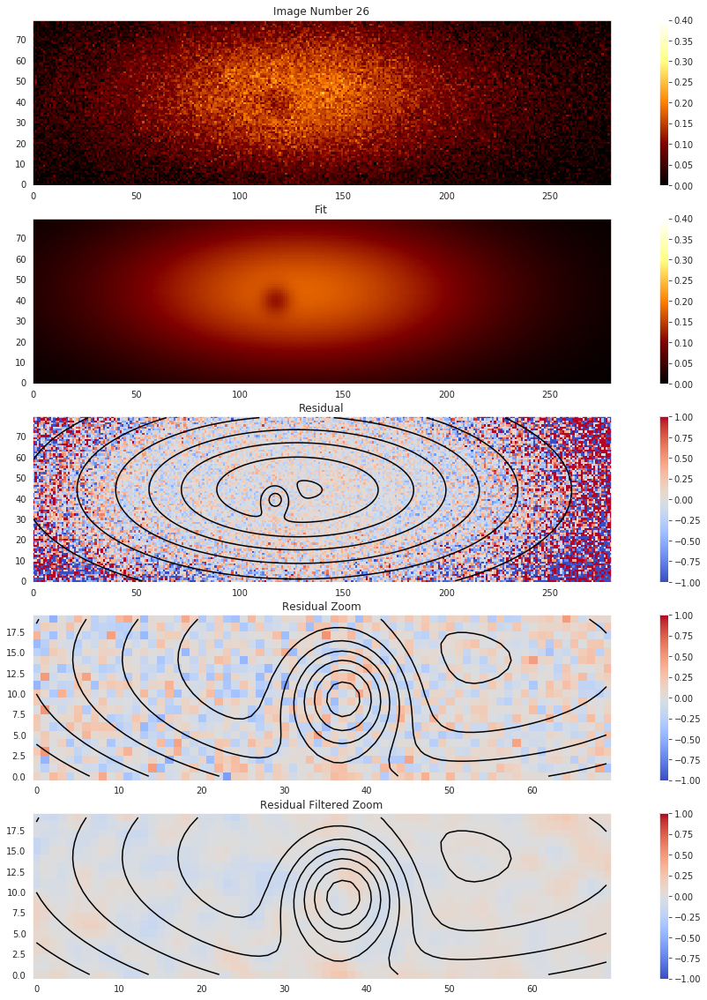

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 89
    # data points      = 22400
    # variables        = 10
    chi-square         = 12.7901043
    reduced chi-square = 5.7124e-04
    Akaike info crit   = -167266.436
    Bayesian info crit = -167186.268
[[Variables]]
    amplitude1:  0.18355615 +/- 5.5373e-04 (0.30%) (init = 0.1)
    xo1:         43.9239202 +/- 0.07864956 (0.18%) (init = 43)
    yo1:         128.777914 +/- 0.17007292 (0.13%) (init = 128)
    sigma_x1:    27.1439394 +/- 0.10558287 (0.39%) (init = 27)
    sigma_y1:    66.2843221 +/- 0.18622680 (0.28%) (init = 66)
    theta1:     -0.00671980 +/- 0.00199235 (29.65%) (init = 0)
    amplitude2: -0.05495666 +/- 0.00354062 (6.44%) (init = 0)
    xo2:         39.9436357 +/- 0.34944126 (0.87%) (init = 39)
    yo2:         116.994405 +/- 0.34770292 (0.30%) (init = 117)
    sigma_x2:    5.38415685 +/- 0.26189183 (4.86%) (init = 3)
    sigma_y2:    5.38415685 +/- 0.26

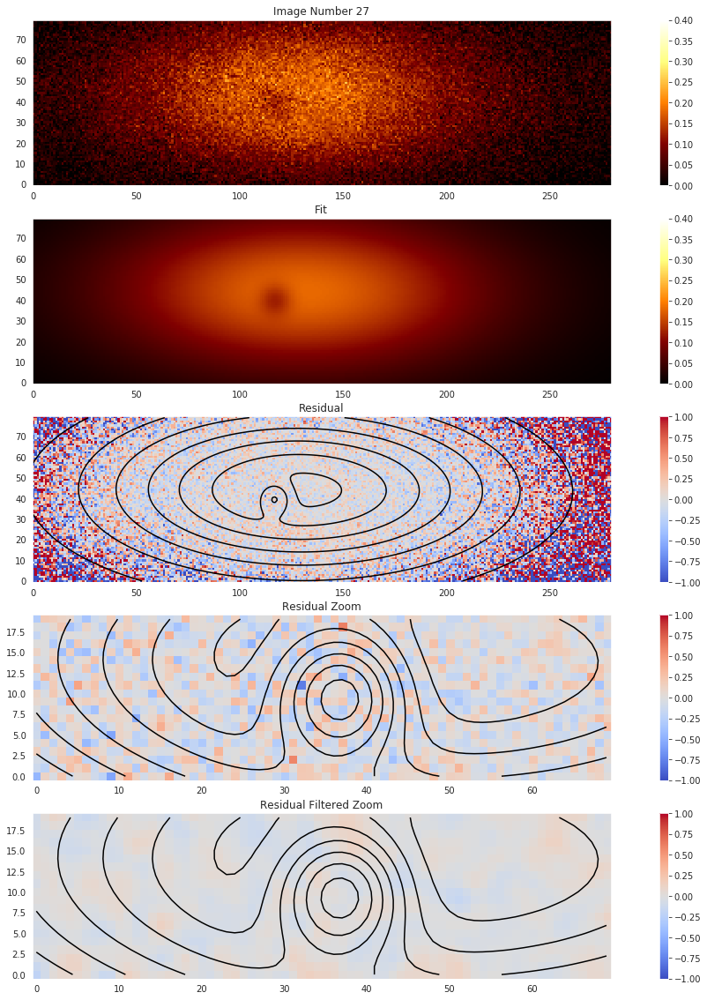

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 89
    # data points      = 22400
    # variables        = 10
    chi-square         = 14.2200340
    reduced chi-square = 6.3511e-04
    Akaike info crit   = -164892.483
    Bayesian info crit = -164812.315
[[Variables]]
    amplitude1:  0.17810039 +/- 5.8361e-04 (0.33%) (init = 0.1)
    xo1:         44.0509369 +/- 0.08638037 (0.20%) (init = 43)
    yo1:         129.120282 +/- 0.18511521 (0.14%) (init = 128)
    sigma_x1:    27.4067918 +/- 0.11662113 (0.43%) (init = 27)
    sigma_y1:    66.7491439 +/- 0.20327086 (0.30%) (init = 66)
    theta1:     -0.00105760 +/- 0.00216905 (205.09%) (init = 0)
    amplitude2: -0.04695404 +/- 0.00359956 (7.67%) (init = 0)
    xo2:         39.5213551 +/- 0.43226723 (1.09%) (init = 39)
    yo2:         116.652200 +/- 0.42953143 (0.37%) (init = 117)
    sigma_x2:    5.57723118 +/- 0.32469175 (5.82%) (init = 3)
    sigma_y2:    5.57723118 +/- 0.3

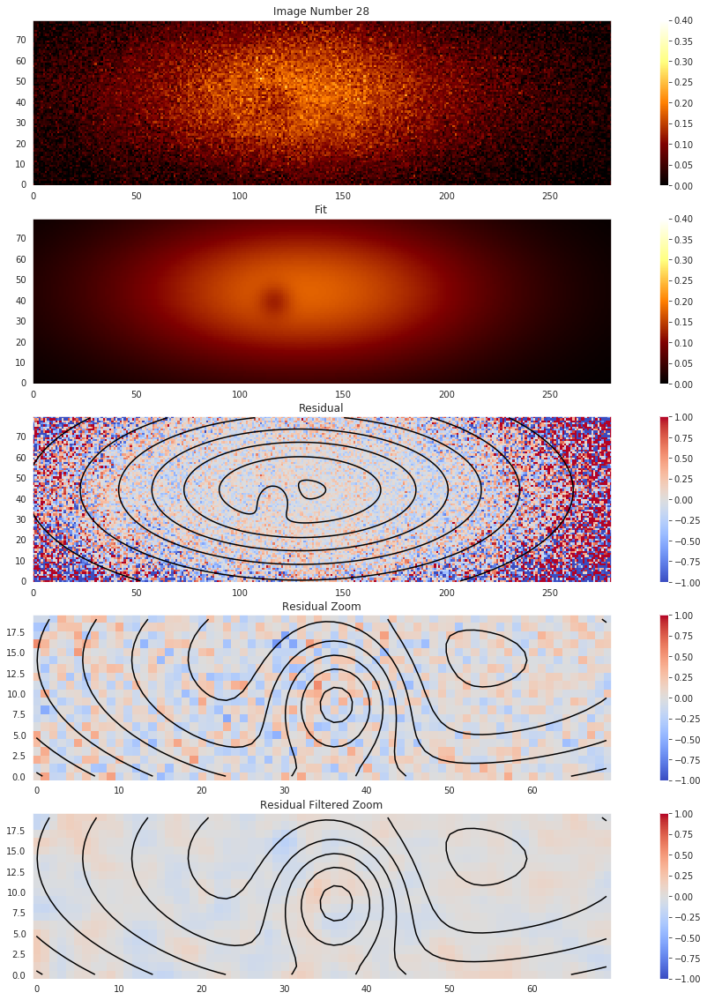

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 67
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.0453224
    reduced chi-square = 5.8264e-04
    Akaike info crit   = -166823.860
    Bayesian info crit = -166743.692
[[Variables]]
    amplitude1:  0.17839976 +/- 5.4971e-04 (0.31%) (init = 0.1)
    xo1:         44.0317939 +/- 0.08190672 (0.19%) (init = 43)
    yo1:         128.211952 +/- 0.17746832 (0.14%) (init = 128)
    sigma_x1:    27.3566772 +/- 0.11053376 (0.40%) (init = 27)
    sigma_y1:    67.0580596 +/- 0.19484625 (0.29%) (init = 66)
    theta1:     -5.5313e-05 +/- 0.00205214 (3710.06%) (init = 0)
    amplitude2: -0.05604114 +/- 0.00374244 (6.68%) (init = 0)
    xo2:         40.4953257 +/- 0.34537117 (0.85%) (init = 39)
    yo2:         116.816889 +/- 0.34394839 (0.29%) (init = 117)
    sigma_x2:    5.14819600 +/- 0.25778481 (5.01%) (init = 3)
    sigma_y2:    5.14819600 +/- 0.

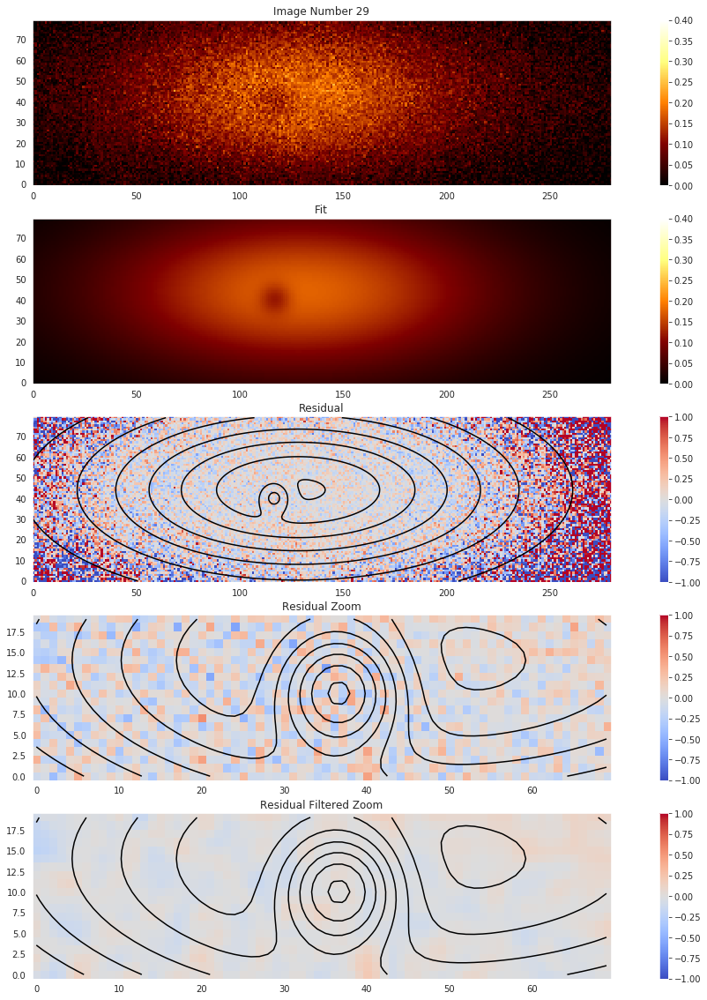

[[Model]]
    Model(two_Gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 158
    # data points      = 22400
    # variables        = 10
    chi-square         = 13.0450889
    reduced chi-square = 5.8263e-04
    Akaike info crit   = -166824.261
    Bayesian info crit = -166744.093
[[Variables]]
    amplitude1:  0.18943409 +/- 5.5830e-04 (0.29%) (init = 0.1)
    xo1:         43.9845842 +/- 0.07717771 (0.18%) (init = 43)
    yo1:         128.979699 +/- 0.16682215 (0.13%) (init = 128)
    sigma_x1:    27.2485067 +/- 0.10383526 (0.38%) (init = 27)
    sigma_y1:    66.6711848 +/- 0.18313136 (0.27%) (init = 66)
    theta1:     -0.00269379 +/- 0.00194044 (72.03%) (init = 0)
    amplitude2: -0.05244538 +/- 0.00352616 (6.72%) (init = 0)
    xo2:         39.7599841 +/- 0.37011068 (0.93%) (init = 39)
    yo2:         117.129219 +/- 0.36807145 (0.31%) (init = 117)
    sigma_x2:    5.45815167 +/- 0.27754873 (5.09%) (init = 3)
    sigma_y2:    5.45815167 +/- 0.2

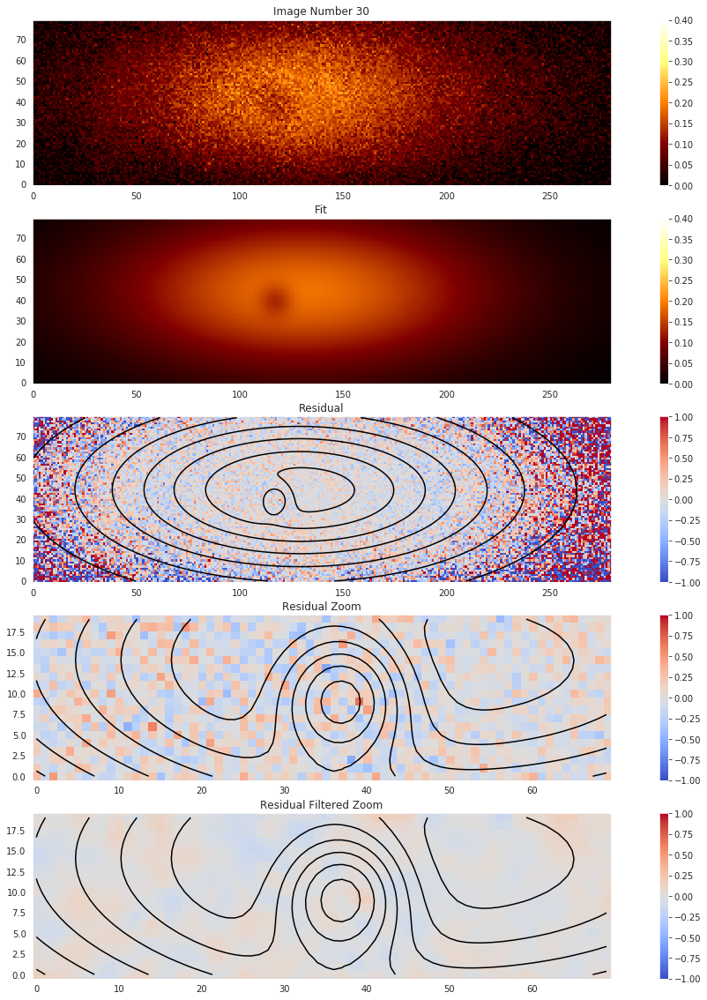

In [110]:
results=list()

model_twoG = Model(two_Gaussian)

params = Parameters()

params = model_twoG.make_params()


'''
    amplitude1:  0.18943828 +/- 5.5803e-04 (0.29%) (init = 0.1)
    xo1:         43.9844093 +/- 0.07717772 (0.18%) (init = 35)
    yo1:         128.979486 +/- 0.16682393 (0.13%) (init = 130)
    sigma_x1:    27.2481032 +/- 0.10383034 (0.38%) (init = 31)
    sigma_y1:    66.6704793 +/- 0.18311518 (0.27%) (init = 66)
    theta1:     -0.00269272 +/- 0.00194052 (72.07%) (init = 0)
    amplitude2: -0.05239251 +/- 0.00353331 (6.74%) (init = 0)
    xo2:         39.7580749 +/- 0.36950947 (0.93%) (init = 38)
    yo2:         117.129578 +/- 0.36746614 (0.31%) (init = 123)
    sigma_x2:    5.46449563 +/- 0.27710376 (5.07%) (init = 2)
    sigma_y2:    5.46449563 +/- 0.27710376 (5.07%) == 'sigma_x2'
'''

# cloud distribution
params.add('amplitude1',value=0.1)
params.add('yo1',value=128*binning_scale,min=100*binning_scale,max=200*binning_scale)
params.add('xo1',value=43*binning_scale,min=20*binning_scale,max=60*binning_scale)
params.add('sigma_x1',value=27*binning_scale,min=10*binning_scale,max=100*binning_scale)
params.add('sigma_y1',value=66*binning_scale,min=10*binning_scale,max=100*binning_scale)
params.add('theta1',value=0,min=-np.pi/10,max=np.pi/10)

# EIT/Autler-Townes-dip
params.add('amplitude2',value=0.00,min=-1,max=1,vary=True)
params.add('yo2',value=117*binning_scale,min=114*binning_scale,max=120*binning_scale,vary=True)
params.add('xo2',value=39*binning_scale,min=36*binning_scale,max=43*binning_scale,vary=True)
params.add('sigma_x2',value=2*binning_scale,min=3*binning_scale,max=8*binning_scale,vary=True)
#params.add('sigma_y2',value=10,min=3,max=15)
params.add('sigma_y2',expr='sigma_x2',vary=False)
params.add('theta2',value=0,min=0,max=np.pi,vary=False)

# offset
params.add('offset',value=0,vary=False)
bg_mean,bg_std = make_background(N)

model=model_twoG


for n in range(0,len(variables)):
    bg,std= make_background(N)
    image = fitsopen_bg(n,bg)
    #image_weights=fitsopen_std(n)[0]
    #image_weights=1/image_weights
    #image_weights=image_weights/np.mean(image_weights)
    #image_weights=gaussian_filter(image_weights, 1, order=0, output=None, mode='nearest', cval=0.0, truncate=4.0)
    #image =  gaussian_filter(image, 1, order=0, output=None, mode='nearest', cval=0.0, truncate=4.0)
    shape = image.shape
    x,y = np.mgrid[0:shape[0],0:shape[1]]
    image_flat=image.flatten() 
    #weights_flat=image_weights.flatten()
    out = model.fit(image_flat,params,xy_mesh=(x,y))##method='Powel')
    fig,ax = plt.subplots(5,1,figsize=(20,20))
    results.append(copy.deepcopy(out))
    #params = out.params
    #out.params.pretty_print()
    print(out.fit_report())
    #print(out.success)
    vmax = 0.4
    ax[0].set_title('Image Number '+str(n))
    ax[0].imshow(image, origin='bottom',vmin=0, vmax=vmax)
    fig.colorbar(ax[0].imshow(image, origin='bottom',vmin=0, vmax=vmax),ax=ax[0])
    ax[1].set_title('Fit')
    ax[1].imshow(out.best_fit.reshape(shape),origin='bottom',vmin=0, vmax=vmax)
    fig.colorbar(ax[1].imshow(out.best_fit.reshape(shape),origin='bottom',vmin=0, vmax=vmax),ax=ax[1])
    ax[2].set_title('Residual')
    ax[2].imshow((image-out.best_fit.reshape(shape))/out.best_fit.reshape(shape),origin='bottom',vmin=-1, vmax=1, cmap='coolwarm')
    ax[2].contour(out.best_fit.reshape(shape),colors='k')
    fig.colorbar(ax[2].imshow((image-out.best_fit.reshape(shape))/out.best_fit.reshape(shape),origin='bottom',vmin=-1, vmax=1, cmap='coolwarm') ,ax=ax[2])
    ax[3].set_title('Residual Zoom')
    ax[3].imshow((image[30:50,110:130]-out.best_fit.reshape(shape)[30:50,110:130])/out.best_fit.reshape(shape)[30:50,110:130],origin='bottom',vmin=-1, vmax=1, cmap='coolwarm')
    ax[3].contour(out.best_fit.reshape(shape)[30:50,80:150],colors='k')
    fig.colorbar(ax[3].imshow((image[30:50,80:150]-out.best_fit.reshape(shape)[30:50,80:150])/out.best_fit.reshape(shape)[30:50,80:150],origin='bottom',vmin=-1, vmax=1, cmap='coolwarm'), ax=ax[3])
    ax[4].set_title('Residual Filtered Zoom')
    ax[4].imshow(gaussian_filter((image[30:50,110:130]-out.best_fit.reshape(shape)[30:50,110:130])/out.best_fit.reshape(shape)[30:50,110:130],1),origin='bottom',vmin=-1, vmax=1, cmap='coolwarm')
    ax[4].contour(out.best_fit.reshape(shape)[30:50,80:150],colors='k')
    fig.colorbar(ax[4].imshow(gaussian_filter((image[30:50,80:150]-out.best_fit.reshape(shape)[30:50,80:150])/out.best_fit.reshape(shape)[30:50,80:150],1),origin='bottom',vmin=-1, vmax=1, cmap='coolwarm'), ax=ax[4])
    #ax[3].set_title('Noise Map')
    #ax[3].imshow(1/image_weights,origin='bottom',vmin=0.5, vmax=1.5, cmap='afmhot')
    #fig.colorbar(ax[3].imshow(1/image_weights,origin='bottom',vmin=0.5, vmax=1.5, cmap='afmhot'), ax=ax[3])
    
    #Axes3D.imshow((image[30:50,110:130]-out.best_fit.reshape(shape)[30:50,110:130])/out.best_fit.reshape(shape)[30:50,110:130],origin='bottom',vmin=-1, vmax=1, cmap='coolwarm')
    #Axes3D.scatter(ax3D,xs=np.linspace(0,19,20),ys=np.linspace(0,19,20),zs=(image[30:50,110:130]-out.best_fit.reshape(shape)[30:50,110:130])/out.best_fit.reshape(shape)[30:50,110:130],zdir='z')
    #fig3D.colorbar(ax[3].imshow((image[30:50,110:130]-out.best_fit.reshape(shape)[30:50,110:130])/out.best_fit.reshape(shape)[30:50,110:130],origin='bottom',vmin=-1, vmax=1, cmap='coolwarm'), ax=ax[3])

    plt.show()

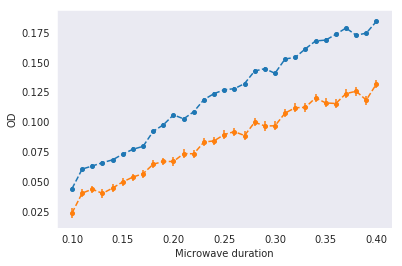

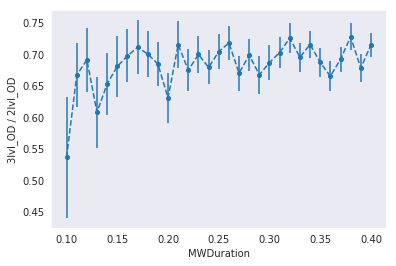

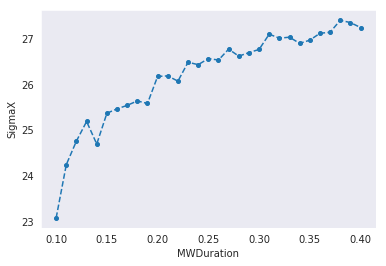

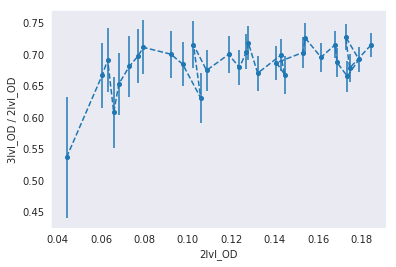

In [175]:
Twolevel = [model_twoG.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0]-r.params['amplitude2'].value  for r in results]
Mediumlength=[r.params['sigma_x1'].value for r in results]
#Twolevel = [r.params['amplitude1'].value  for r in results]
#Twolevel= [r.eval(r.params,xy_mesh=(r.params['xo1'].value,r.params['yo1'].value))[0] for r in results]
Threelevel = [r.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0] for r in results]
ThreeOverTwo=[r.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0] /(model_twoG.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0]-r.params['amplitude2'].value)  for r in results]
error2lvl= [r.eval_uncertainty(r.params,xy_mesh=(r.params['xo1'].value,r.params['yo1'].value))[0] for r in results]
error3lvl= [r.eval_uncertainty(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0] for r in results]
weight2lvl= [r.redchi*2.6*10**4 for r in results]
weight3lvl= [1/(1.5*r.eval_uncertainty(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0]) for r in results]
error3over2=[ (r.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0] /(model_twoG.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0]-r.params['amplitude2'].value))*np.sqrt((r.eval_uncertainty(r.params,xy_mesh=(r.params['xo1'].value,r.params['yo1'].value))[0]/r.eval(r.params,xy_mesh=(r.params['xo1'].value,r.params['yo1'].value))[0])**2+(r.eval_uncertainty(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0]/r.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0])**2)  for r in results]

def TwoLvlTrans(Dp,Dp0,g31,mediumlength,wavelength,density,redlw,Wp):
    """
    prefactor in units of MHz*m^3
    density is in units of 10^15 1/m^3
    detunings,rabi-frequencys and Decay rates in MHz
    """  
    Wc=0
    g21=0
    Dp=Dp-Dp0
    prefactor=6.827*10**(-4)
    l=g31/2/( Dp**2 + (g31/2)**2 )
    l1=np.imag(g31*(-2*Dp+1.j*(g31+redlw))/(2 * Wp**2 *(g31+redlw)/g31 + (g31+redlw)**2 +4*Dp**2))/np.pi
    l2=(8* Dp**2 *g31) / abs((g31+1.j*2*Dp)*(1.j*2*Dp))**2
    return 2*mediumlength*(2*np.pi/wavelength)*prefactor*density*l

def ThreeLvlTrans(Dp,Dp0,Dc,g31,g21,Wc,density,wavelength,mediumlength):
    """
    Imaginary Part of the first order susceptibility
    in the ladder scheme:
    index 1 ~ ground state
    index 2 ~ Rydberg state
    index 3 ~ intermediate state
    prefactor in units of MHz*m^3
    density is in units of 10^15 1/m^3
    detunings,rabi-frequencys and Decay rates in MHz
    """  
    Dp=Dp-Dp0
    d = Dp-Dc
    prefactor=6.827*10**(-4)
    lside=0#(4*d*(Wc**2 - 4*d*Dp)-4*Dp*g21**2) / abs(Wc**2 + (g31+1.j*2*Dp)*(g21+1.j*2*d))**2
    rside=1.j*(8* d**2 *g31+2*g21*(Wc**2 + g21*g31)) / abs(Wc**2 + (g31+1.j*2*Dp)*(g21+1.j*2*d))**2
    
    return 2*mediumlength*(2*np.pi/wavelength)*np.imag(prefactor*density*(lside+rside))

modelL = Model(ThreeLvlTrans,independent_vars=['Dp'])
paramsL = modelL.make_params()
paramsL.add('wavelength',value=0.78,vary=False)
paramsL.add('mediumlength',value=25,vary=True)
paramsL.add('density',value=4,vary=False)
paramsL.add('redlw',value=0,vary=False)
paramsL.add('Wp',value=0,min=0.1,max=1,vary=False)


paramsL.add('g31',value=6.02,min=4,max=8,vary=False)
paramsL.add('Dp0',value=0,min=-1,max=1,vary=True)
paramsL.add('g21',value=10,min=0,max=2,vary=False)
paramsL.add('Wc',value=0,vary=False)

paramsL.add('Dc',value=0,min=-1,max=1,vary=False)

outL = modelL.fit(Twolevel,params=paramsL,weights=weight2lvl,Dp=variables)#,nan_policy='propagate')


Threelevel = [r.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0] for r in results]



model_ThreeLvlTrans = Model(ThreeLvlTrans,independent_vars=['Dp'])
params_ThreeLvlTrans = model_ThreeLvlTrans.make_params()
params_ThreeLvlTrans.add('wavelength',value=outL.params['wavelength'].value,vary=False)
params_ThreeLvlTrans.add('mediumlength',value=outL.params['mediumlength'].value,vary=False)
params_ThreeLvlTrans.add('density',value=outL.params['density'].value,vary=False)

params_ThreeLvlTrans.add('g31',value=outL.params['g31'].value,min=5,max=7,vary=False)
params_ThreeLvlTrans.add('g21',value=0.0,min=0,max=1.3,vary=True)
params_ThreeLvlTrans.add('Wc',value=1.5,min=0.5,max=2.5,vary=True)

params_ThreeLvlTrans.add('Dc',value=0,min=-1,max=1,vary=True)
params_ThreeLvlTrans.add('Dp0',value=outL.params['Dp0'].value,min=-1,max=1,vary=False)
#params_ThreeLvlTrans.add('Dp',value=0.00)

out = model_ThreeLvlTrans.fit(Threelevel,params=params_ThreeLvlTrans,weights=weight2lvl,Dp=variables)#,nan_policy='omit')

v = np.linspace(min(variables),max(variables),200)

#y = [1-np.exp(-r.params['amplitude1'].value) for r in results]
#x = od_2
#y = (1-np.exp(-od_3))/(1-np.exp(-od_2)) 
#plt.errorbar(x,y,yerr=yerr,marker='o',linestyle='',markersize='4')

#plt.plot(v[50:150],model_ThreeLvlTrans.eval(params_ThreeLvlTrans,Dp=v)[50:150])
plt.xlabel("Microwave duration")
plt.ylabel("OD")
plt.savefig("2lvl_OD.png")
plt.errorbar(variables,Twolevel,yerr=error2lvl,marker='o',linestyle='--',markersize='4')
plt.errorbar(variables,Threelevel,yerr=error3lvl,marker='o',linestyle='--',markersize='4')
plt.show()
#plt.plot(v[50:150],model_ThreeLvlTrans.eval(out.params,Dp=v)[50:150])
#plt.plot(v[50:150],modelL.eval(outL.params,Dp=v)[50:150])

#plt.plot(v,model_ThreeLvlTrans.eval(params_ThreeLvlTrans,Dp=v))
#plt.plot(v,modelL.eval(paramsL,Dp=v))


plt.xlabel("MWDuration")
plt.ylabel("3lvl_OD / 2lvl_OD")


#plt.errorbar(variables,Twolevel,yerr=error2lvl,marker='o',linestyle='',markersize='4')
#plt.errorbar(variables,Threelevel,yerr=error3lvl,marker='o',linestyle='-',markersize='4')
plt.errorbar(variables,ThreeOverTwo,yerr=error3over2,marker='o',linestyle='--',markersize='4')
plt.savefig("DensityScan.png")
plt.show()



plt.xlabel("MWDuration")
plt.ylabel("SigmaX")
plt.errorbar(variables,Mediumlength,yerr=error2lvl,marker='o',linestyle='--',markersize='4')
#plt.errorbar(variables,Twolevel,yerr=error2lvl,marker='o',linestyle='--',markersize='4')
plt.savefig("DensityScan.png")
plt.show()


plt.errorbar(Twolevel,ThreeOverTwo,yerr=error3over2,marker='o',linestyle='--',markersize='4')
#plt.errorbar(variables,Threelevel,yerr=error3lvl,marker='o',linestyle='--',markersize='4')
#plt.plot(v,model_ThreeLvlTrans.eval(out.params,Dp=v))
#plt.plot(v,modelL.eval(outL.params,Dp=v))
#plt.errorbar(Twolevel[1:16],Twolevel[1:16]/(1+Twolevel[1:16]),yerr=error2lvl[1:16],marker='o',linestyle='',markersize='4')
plt.xlabel("2lvl_OD")
plt.ylabel("3lvl_OD / 2lvl_OD")
plt.savefig("2lvl_OD.png")
plt.show()

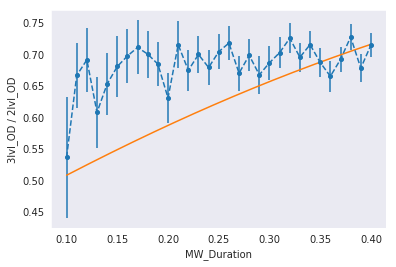

In [166]:
#plt.errorbar(variables,Twolevel,yerr=error2lvl,marker='o',linestyle='',markersize='4')
#plt.errorbar(variables,Threelevel,yerr=error3lvl,marker='o',linestyle='--',markersize='4')



#plt.ylabel("2 lvl Weights")
#plt.plot(variables,weight2lvl)
#plt.show()s

#plt.ylabel("3 lvl Weights")
#plt.plot(variables,weight3lvl)
#plt.show()



#%notebook -e analysis.ipynb
#print(outL.fit_report())
#print(out.fit_report())
#print("2 LEVEL RESPONSE")
#outL.params.pretty_print()
#print("3 LEVEL RESPONSE")
#out.params.pretty_print()
#print(np.mean(Threelevel))
#print(np.std(Threelevel))
#print(np.std(Threelevel)/np.mean(Threelevel))

ThreeDivTwolevel = [r.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0]/
                    (model_twoG.eval(r.params,xy_mesh=(r.params['xo2'].value,r.params['yo2'].value))[0]-r.params['amplitude2'].value)  for r in results]
#Twolevel = [r.params['amplitude1'].value  for r in results]
#Twolevel= [r.eval(r.params,xy_mesh=(r.params['xo1'].value,r.params['yo1'].value))[0] for r in results]

v = np.linspace(min(variables),max(variables),200)

def ThreeOverTwo(Dint,g31,Wc,Wp,redlw):
    """
    Imaginary Part of the first order susceptibility
    in the ladder scheme:
    index 1 ~ ground state
    index 2 ~ Rydberg state
    index 3 ~ intermediate state
    prefactor in units of MHz*m^3
    density is in units of 10^15 1/m^3
    detunings,rabi-frequencys and Decay rates in MHz
    """  
    """
    prefactor in units of MHz*m^3
    density is in units of 10^15 1/m^3
    detunings,rabi-frequencys and Decay rates in MHz
    """ 
    
    l=4 * redlw * Dint**2 *(g31*redlw+2*Wp)
    l1=(Wp**2+Wc**2)*(g31*Wc**2+redlw*Wp**2)
    return l/(l+l1)

def ThreeTwoTrans(Dp,Dp0,Dc,g31,g21,Wc):
    """
    Imaginary Part of the first order susceptibility
    in the ladder scheme:
    index 1 ~ ground state
    index 2 ~ Rydberg state
    index 3 ~ intermediate state
    prefactor in units of MHz*m^3
    density is in units of 10^15 1/m^3
    detunings,rabi-frequencys and Decay rates in MHz
    """  
    Dp=Dp-Dp0
    d = Dp-Dc
    prefactor=6.827*10**(-4)
    lside=0#(4*d*(Wc**2 - 4*d*Dp)-4*Dp*g21**2) / abs(Wc**2 + (g31+1.j*2*Dp)*(g21+1.j*2*d))**2
    rside=(8* d**2 *g31+2*g21*(Wc**2 + g21*g31)) / abs(Wc**2 + (g31+1.j*2*Dp)*(g21+1.j*2*d))**2
    r1=(8* d**2 *g31+2*10*(10*g31)) / abs((g31+1.j*2*Dp)*(10+1.j*2*d))**2
    
    return rside/r1

    
model32 = Model(ThreeTwoTrans,independent_vars=['Dp'])
params32 = modelL.make_params()
params32.add('g31',value=6.02,min=4,max=8,vary=False)
params32.add('Dp0',value=0,min=-1,max=1,vary=False)
params32.add('g21',value=0.1,min=0,max=2,vary=False)
params32.add('Wc',value=1.5,vary=True)
params32.add('Dc',value=-0.14,min=-1,max=1,vary=False)

#finalweights=np.ones(len(variables))
#for n in range(11,19):
#    finalweights[n]=0
#print(finalweights)

#out32 = model32.fit(Twolevel,params=params32,weights=finalweights,Dp=variables)#,nan_policy='propagate')

#print(out32.fit_report())


plt.xlabel("MW_Duration")
plt.ylabel("3lvl_OD / 2lvl_OD")
plt.errorbar(variables,ThreeDivTwolevel,yerr=error3over2,marker='o',linestyle='--',markersize='4')

##plt.plot(v,model32.eval(out32.params,Dp=v))

#Dp=0
#Dp0=0
#Dc=0
#g31=6.02
#g21=0.1
#Wc=1.5
#density=np.linspace(1,4,200)
#wavelength=0.78
#mediumlength=24.6

C6=513000
g21=0.2
redlw=0.2
Wc=2.06
Wp=0.28
g31=6.02
N=4
density=np.linspace(0.004,0.005,200)
rb=(2*C6/(g21*redlw+Wc**2))**(1/6)
vb=4/3*np.pi*rb**3
Dint=C6/rb**6*(density*vb/N)**2

#print(Dint)

plt.plot(v,ThreeOverTwo(Dint,6.02,2.06,0.28,redlw))

#plt.plot(v,np.ones(200)*ThreeLvlTrans(Dp,Dp0,Dc,g31,g21,Wc,density,wavelength,mediumlength)/ThreeLvlTrans(v,Dp0,Dc,g31,100,0,density,wavelength,mediumlength))

N=np.linspace(3,4,200)

#plt.plot(N,(0.0+N)/(1+N))





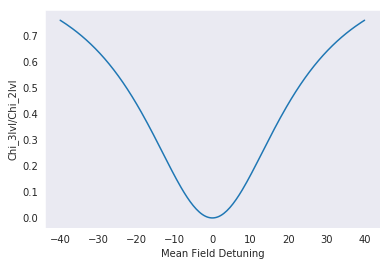

In [156]:
v = np.linspace(-40,40,200)
plt.xlabel("Mean Field Detuning")
plt.ylabel("Chi_3lvl/Chi_2lvl")

plt.plot(v,ThreeOverTwo(v,6.02,2.5,0.28,0.1))




4
0.7836005880024924


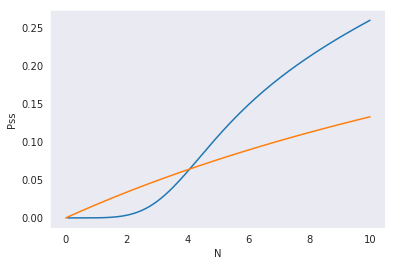

In [116]:
def Pss(N,g21,Wc,C6,density,Wp,redlw):
    rb=(2*C6/(g21*redlw+Wc**2))**(1/6)
    vb=4/3*np.pi*rb**3
    Dint=C6/rb**6*(density*vb/N)**2
    rho_0=(Wp/Wc)**2
    rho=(1-ThreeOverTwo(Dint,g31,Wc,Wp,redlw))
    return rho*rho_0 * N/(rho*rho_0*N+1-rho*rho_0)

def Pss_no_int(N,Wc,Wp):
    rho_0=(Wp/Wc)**2
    return rho_0 * N/(rho_0*N+1-rho_0)




v = np.linspace(0,10,150)

plt.xlabel("N")
plt.ylabel("Pss")


#plt.plot(v,Pss_int(v,0.02,1.5,20,0.004,0.28,0.1))
plt.plot(v,Pss(v,0.02,1.5,513000,0.004,0.28,0.1))
plt.plot(v,0.5*Pss_no_int(v,1.5,0.28))



C6=513000
g21=0.2
redlw=0.2
Wc=1.5
Wp=0.28
g31=6.02
N=4
density=0.004
rb=(2*C6/(g21*redlw+Wc**2))**(1/6)
vb=4/3*np.pi*rb**3
Dint=C6/rb**6*(density*vb/N)**2
print(N)
print(ThreeOverTwo(Dint,g31,Wc,Wp,redlw))
